# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
# !pip install matplotlib
# !pip install tensorflow
# tf.__version__

In [2]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [3]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

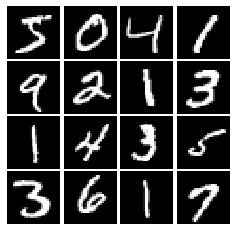

In [4]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    ans = tf.maximum(alpha * x, x)
        
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return ans


Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    ans = tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return ans

Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256, input_shape = (784,), activation = leaky_relu),
        tf.keras.layers.Dense(256, activation = leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape = (noise_dim,), activation = tf.nn.relu),
        tf.keras.layers.Dense(1024, activation = tf.nn.relu),
        tf.keras.layers.Dense(784, activation = tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [13]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss_real = cross_entropy(tf.ones_like(logits_real), logits_real)
    loss_fake = cross_entropy(tf.zeros_like(logits_fake), logits_fake)

    loss = loss_real + loss_fake

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [16]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [17]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.197, G:0.7345
Instructions for updating:
Use tf.identity instead.


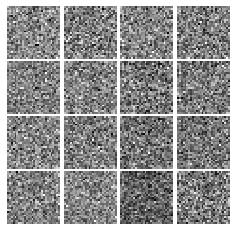

Epoch: 0, Iter: 20, D: 0.5838, G:0.9598


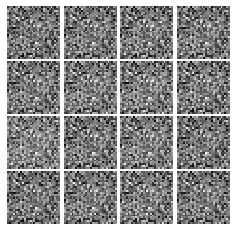

Epoch: 0, Iter: 40, D: 0.4313, G:1.296


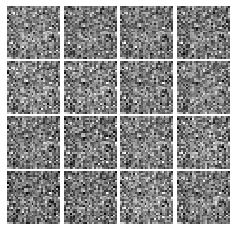

Epoch: 0, Iter: 60, D: 1.003, G:1.419


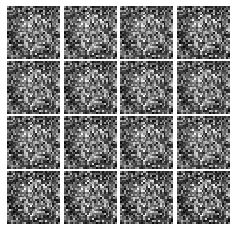

Epoch: 0, Iter: 80, D: 1.113, G:1.282


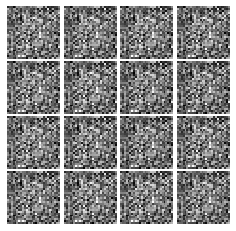

Epoch: 0, Iter: 100, D: 2.054, G:0.3266


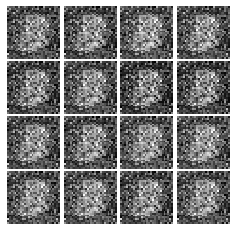

Epoch: 0, Iter: 120, D: 1.285, G:0.9067


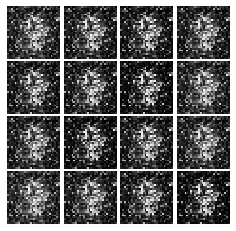

Epoch: 0, Iter: 140, D: 2.013, G:1.963


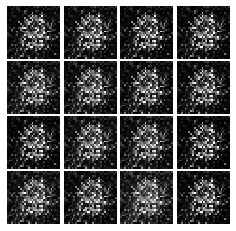

Epoch: 0, Iter: 160, D: 1.632, G:1.346


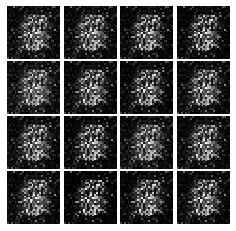

Epoch: 0, Iter: 180, D: 1.117, G:1.543


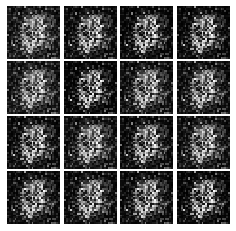

Epoch: 0, Iter: 200, D: 1.686, G:2.087


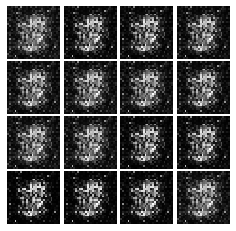

Epoch: 0, Iter: 220, D: 1.057, G:1.949


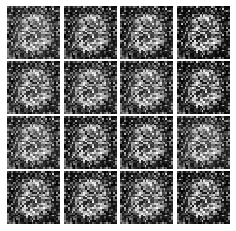

Epoch: 0, Iter: 240, D: 1.833, G:0.8513


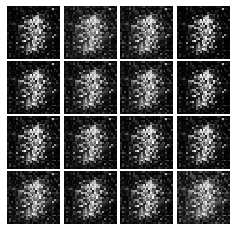

Epoch: 0, Iter: 260, D: 1.31, G:1.458


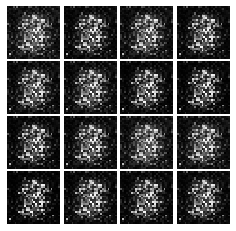

Epoch: 0, Iter: 280, D: 0.9288, G:1.356


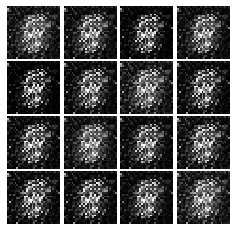

Epoch: 0, Iter: 300, D: 1.292, G:1.79


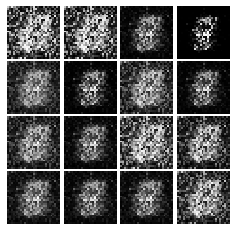

Epoch: 0, Iter: 320, D: 1.567, G:0.8408


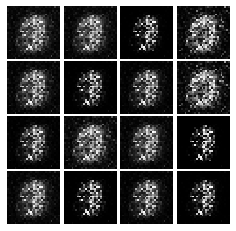

Epoch: 0, Iter: 340, D: 1.174, G:1.17


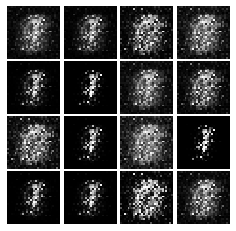

Epoch: 0, Iter: 360, D: 2.062, G:2.219


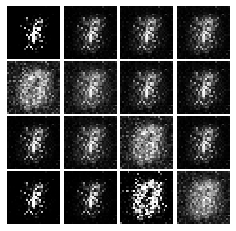

Epoch: 0, Iter: 380, D: 1.139, G:1.113


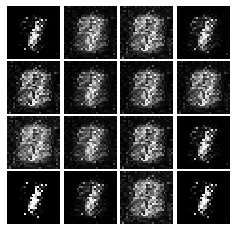

Epoch: 0, Iter: 400, D: 0.9684, G:1.555


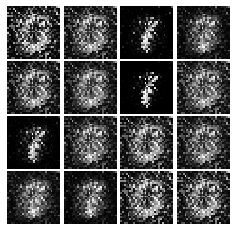

Epoch: 0, Iter: 420, D: 1.163, G:1.248


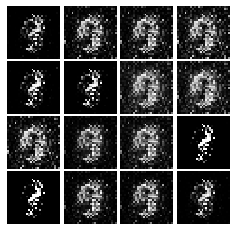

Epoch: 0, Iter: 440, D: 1.078, G:1.267


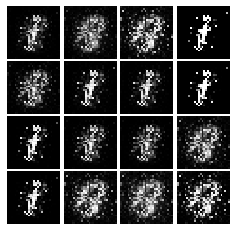

Epoch: 0, Iter: 460, D: 0.8065, G:1.596


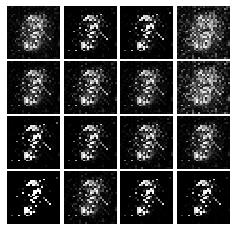

Epoch: 1, Iter: 480, D: 0.977, G:1.382


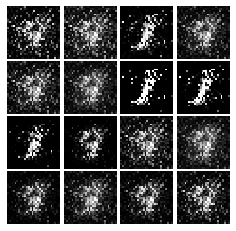

Epoch: 1, Iter: 500, D: 0.919, G:1.852


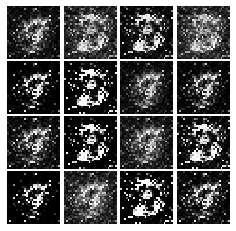

Epoch: 1, Iter: 520, D: 1.589, G:1.259


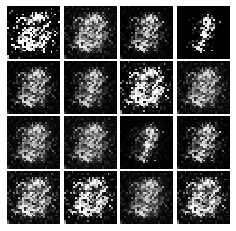

Epoch: 1, Iter: 540, D: 1.375, G:0.7766


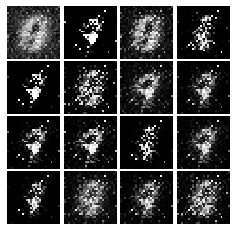

Epoch: 1, Iter: 560, D: 1.222, G:1.508


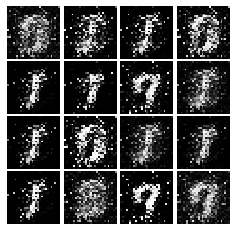

Epoch: 1, Iter: 580, D: 1.391, G:1.083


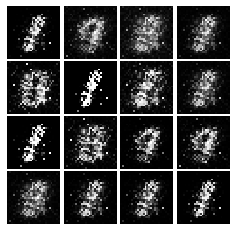

Epoch: 1, Iter: 600, D: 1.762, G:1.153


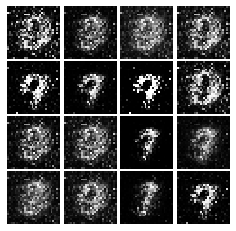

Epoch: 1, Iter: 620, D: 1.092, G:1.132


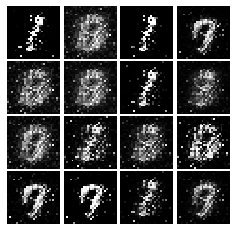

Epoch: 1, Iter: 640, D: 1.15, G:1.724


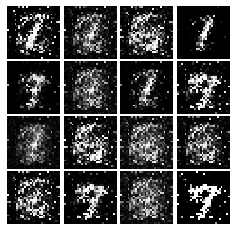

Epoch: 1, Iter: 660, D: 1.094, G:0.9516


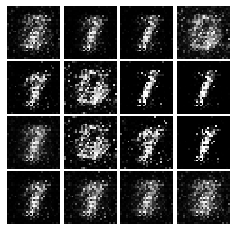

Epoch: 1, Iter: 680, D: 1.081, G:1.711


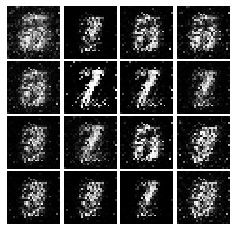

Epoch: 1, Iter: 700, D: 2.402, G:0.7195


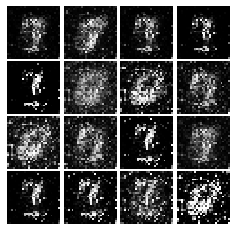

Epoch: 1, Iter: 720, D: 1.399, G:1.039


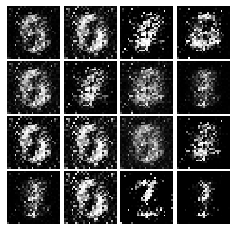

Epoch: 1, Iter: 740, D: 1.122, G:1.363


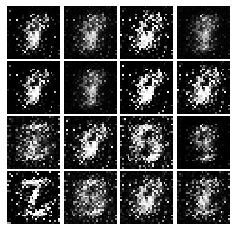

Epoch: 1, Iter: 760, D: 0.9847, G:1.434


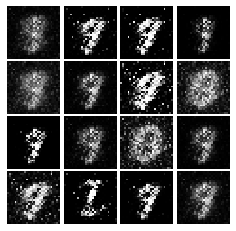

Epoch: 1, Iter: 780, D: 1.226, G:1.891


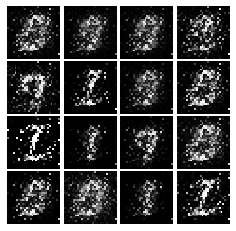

Epoch: 1, Iter: 800, D: 1.211, G:1.153


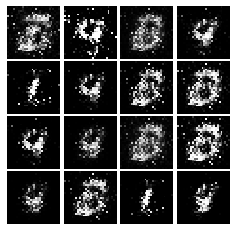

Epoch: 1, Iter: 820, D: 1.219, G:1.205


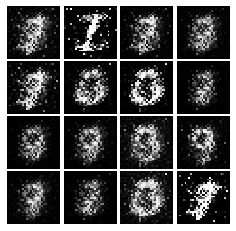

Epoch: 1, Iter: 840, D: 1.211, G:1.971


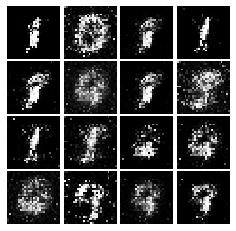

Epoch: 1, Iter: 860, D: 1.634, G:0.872


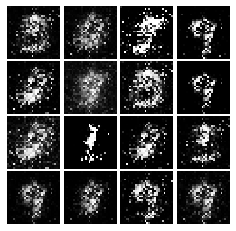

Epoch: 1, Iter: 880, D: 1.003, G:1.179


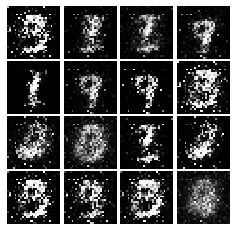

Epoch: 1, Iter: 900, D: 1.144, G:1.912


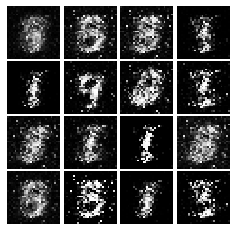

Epoch: 1, Iter: 920, D: 1.601, G:0.8241


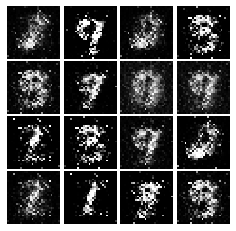

Epoch: 2, Iter: 940, D: 1.101, G:1.01


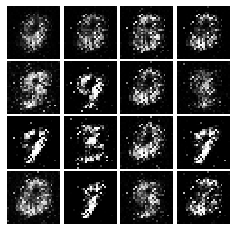

Epoch: 2, Iter: 960, D: 1.624, G:1.096


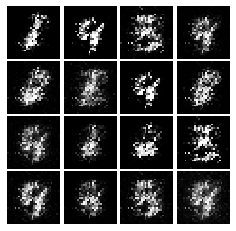

Epoch: 2, Iter: 980, D: 1.14, G:1.134


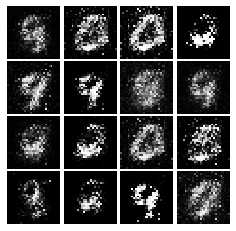

Epoch: 2, Iter: 1000, D: 1.266, G:1.144


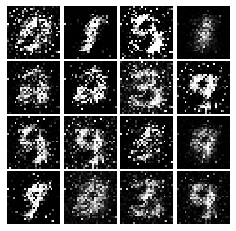

Epoch: 2, Iter: 1020, D: 1.296, G:0.9789


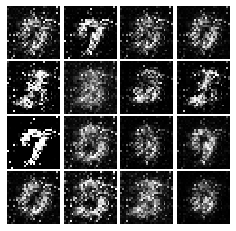

Epoch: 2, Iter: 1040, D: 1.25, G:1.341


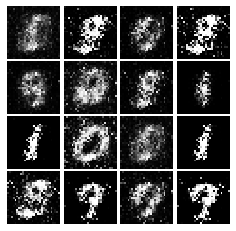

Epoch: 2, Iter: 1060, D: 1.321, G:0.8885


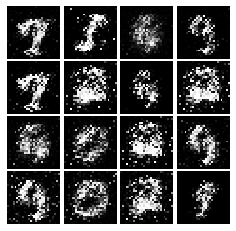

Epoch: 2, Iter: 1080, D: 1.342, G:1.051


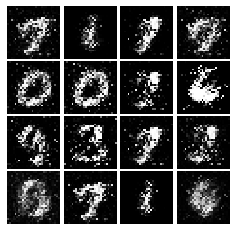

Epoch: 2, Iter: 1100, D: 1.226, G:0.9813


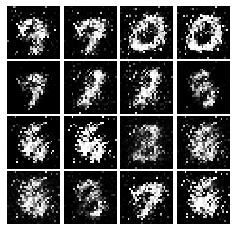

Epoch: 2, Iter: 1120, D: 1.212, G:0.9628


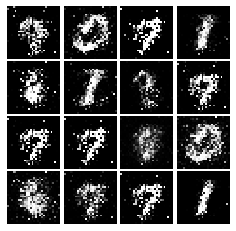

Epoch: 2, Iter: 1140, D: 1.033, G:1.882


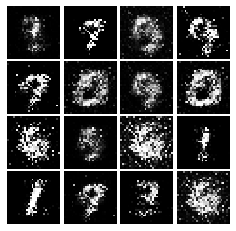

Epoch: 2, Iter: 1160, D: 1.163, G:0.9677


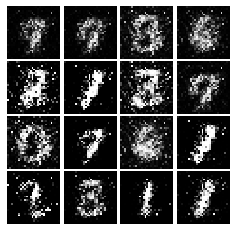

Epoch: 2, Iter: 1180, D: 1.302, G:0.91


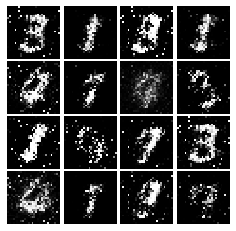

Epoch: 2, Iter: 1200, D: 1.073, G:1.102


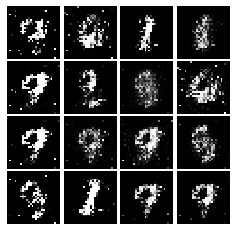

Epoch: 2, Iter: 1220, D: 1.274, G:1.554


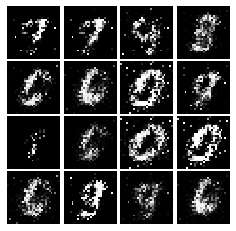

Epoch: 2, Iter: 1240, D: 1.345, G:0.4442


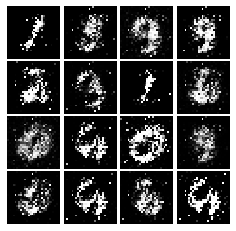

Epoch: 2, Iter: 1260, D: 1.323, G:0.6426


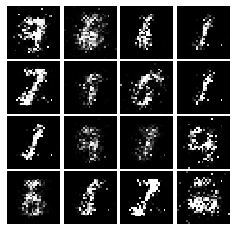

Epoch: 2, Iter: 1280, D: 1.186, G:1.186


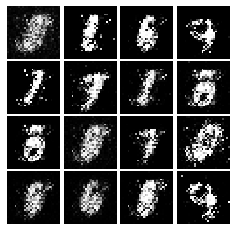

Epoch: 2, Iter: 1300, D: 1.318, G:1.115


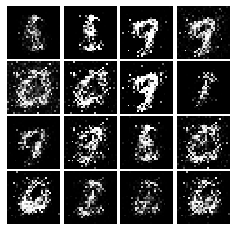

Epoch: 2, Iter: 1320, D: 1.357, G:0.9626


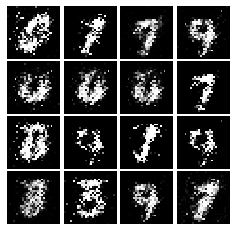

Epoch: 2, Iter: 1340, D: 1.288, G:0.7886


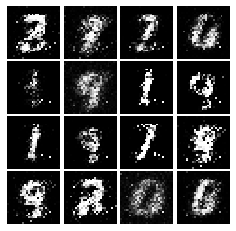

Epoch: 2, Iter: 1360, D: 1.366, G:0.9738


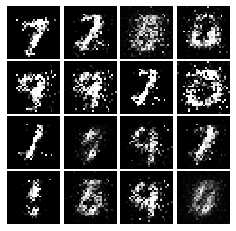

Epoch: 2, Iter: 1380, D: 1.306, G:0.7112


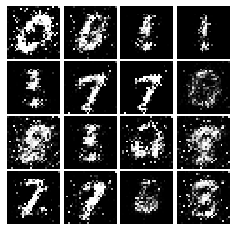

Epoch: 2, Iter: 1400, D: 1.271, G:0.9826


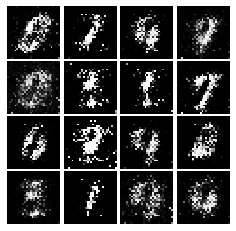

Epoch: 3, Iter: 1420, D: 1.241, G:1.077


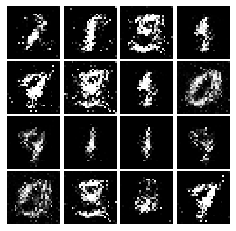

Epoch: 3, Iter: 1440, D: 1.227, G:1.141


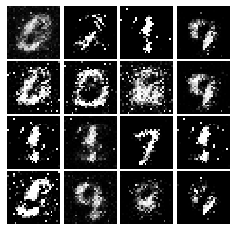

Epoch: 3, Iter: 1460, D: 1.263, G:1.646


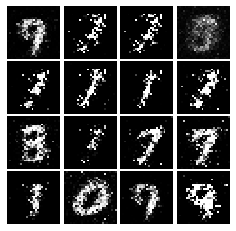

Epoch: 3, Iter: 1480, D: 1.328, G:0.8624


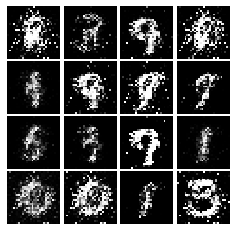

Epoch: 3, Iter: 1500, D: 1.345, G:0.9837


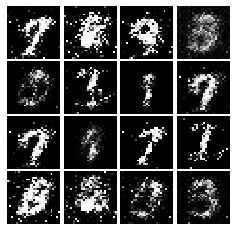

Epoch: 3, Iter: 1520, D: 1.274, G:1.045


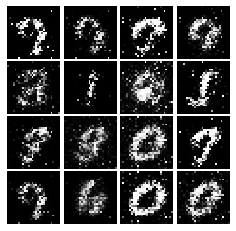

Epoch: 3, Iter: 1540, D: 1.338, G:0.8833


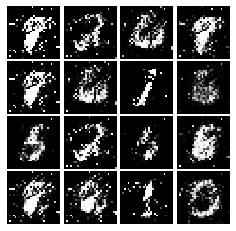

Epoch: 3, Iter: 1560, D: 1.202, G:1.065


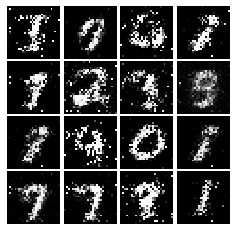

Epoch: 3, Iter: 1580, D: 1.341, G:3.863


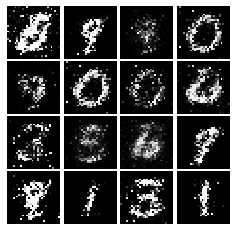

Epoch: 3, Iter: 1600, D: 1.189, G:0.9686


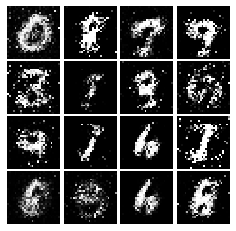

Epoch: 3, Iter: 1620, D: 1.252, G:0.9099


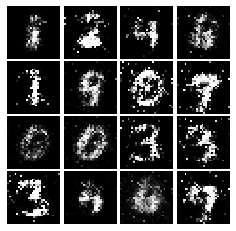

Epoch: 3, Iter: 1640, D: 1.364, G:0.8346


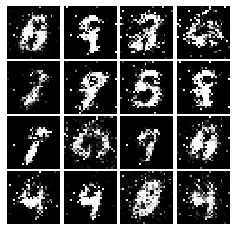

Epoch: 3, Iter: 1660, D: 1.226, G:0.8414


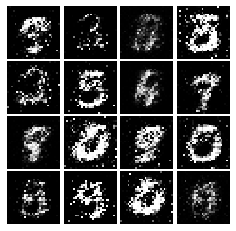

Epoch: 3, Iter: 1680, D: 1.12, G:0.7508


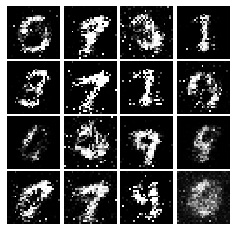

Epoch: 3, Iter: 1700, D: 1.271, G:0.8497


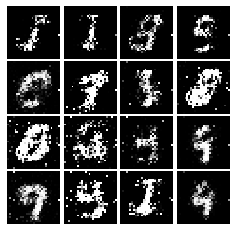

Epoch: 3, Iter: 1720, D: 1.268, G:0.7562


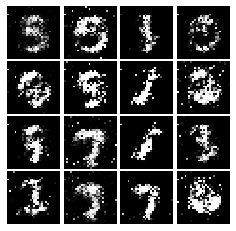

Epoch: 3, Iter: 1740, D: 1.288, G:0.8292


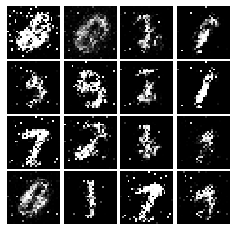

Epoch: 3, Iter: 1760, D: 1.266, G:0.9052


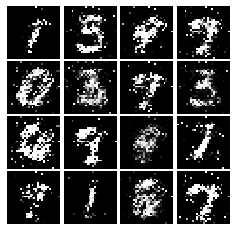

Epoch: 3, Iter: 1780, D: 1.301, G:1.059


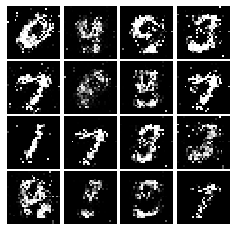

Epoch: 3, Iter: 1800, D: 1.307, G:0.8075


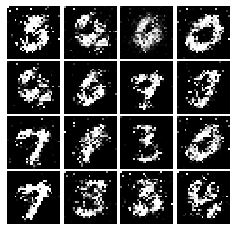

Epoch: 3, Iter: 1820, D: 1.287, G:0.935


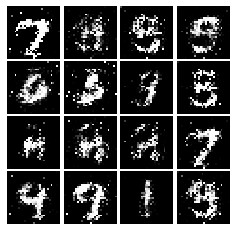

Epoch: 3, Iter: 1840, D: 1.192, G:0.9585


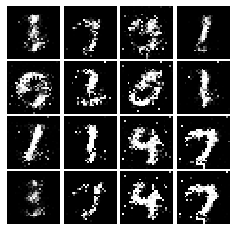

Epoch: 3, Iter: 1860, D: 1.435, G:0.9321


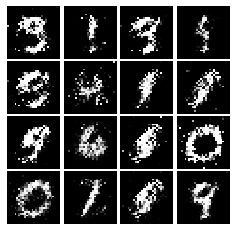

Epoch: 4, Iter: 1880, D: 1.329, G:0.7982


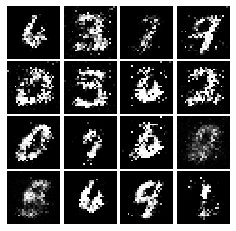

Epoch: 4, Iter: 1900, D: 1.271, G:0.9012


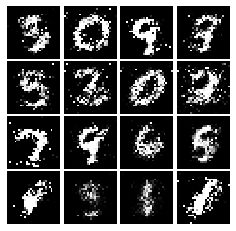

Epoch: 4, Iter: 1920, D: 1.215, G:0.9164


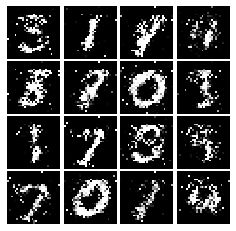

Epoch: 4, Iter: 1940, D: 1.203, G:1.038


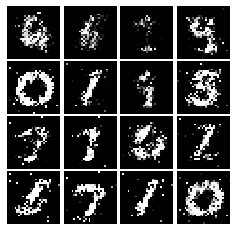

Epoch: 4, Iter: 1960, D: 1.316, G:1.018


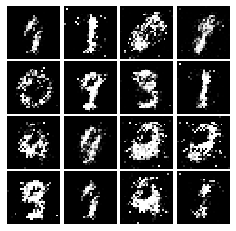

Epoch: 4, Iter: 1980, D: 1.199, G:0.9479


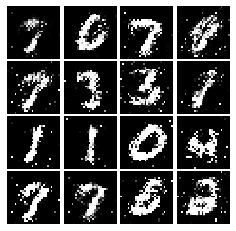

Epoch: 4, Iter: 2000, D: 1.35, G:0.8135


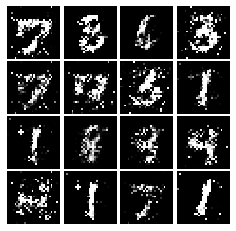

Epoch: 4, Iter: 2020, D: 1.233, G:0.8477


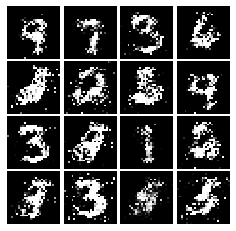

Epoch: 4, Iter: 2040, D: 1.267, G:0.8721


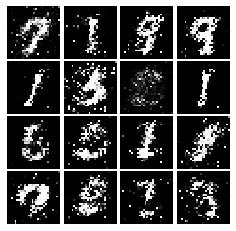

Epoch: 4, Iter: 2060, D: 1.196, G:1.047


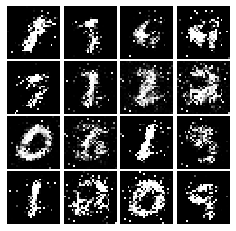

Epoch: 4, Iter: 2080, D: 1.283, G:0.9581


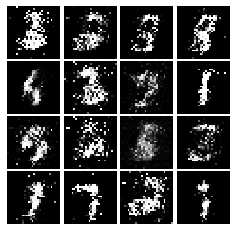

Epoch: 4, Iter: 2100, D: 1.344, G:0.9781


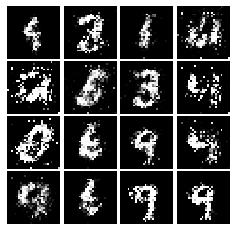

Epoch: 4, Iter: 2120, D: 1.236, G:0.8877


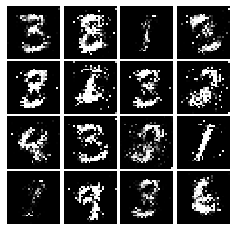

Epoch: 4, Iter: 2140, D: 1.288, G:0.9538


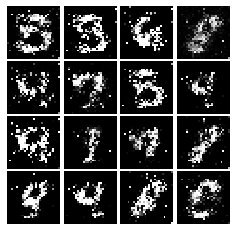

Epoch: 4, Iter: 2160, D: 1.473, G:0.7509


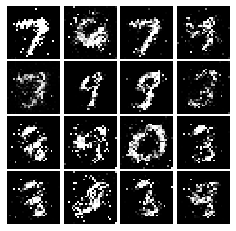

Epoch: 4, Iter: 2180, D: 1.426, G:0.6713


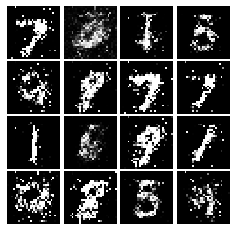

Epoch: 4, Iter: 2200, D: 1.272, G:0.9801


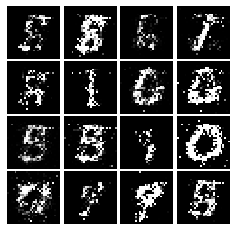

Epoch: 4, Iter: 2220, D: 1.304, G:0.411


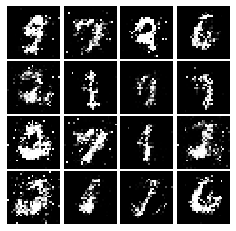

Epoch: 4, Iter: 2240, D: 1.343, G:0.8789


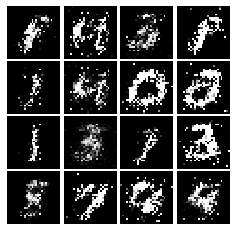

Epoch: 4, Iter: 2260, D: 1.253, G:0.8569


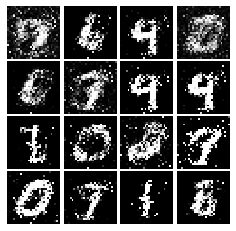

Epoch: 4, Iter: 2280, D: 1.166, G:0.9883


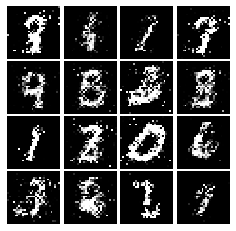

Epoch: 4, Iter: 2300, D: 1.252, G:0.798


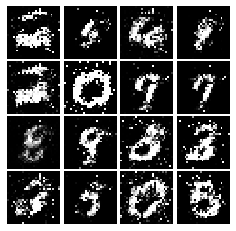

Epoch: 4, Iter: 2320, D: 1.261, G:0.9125


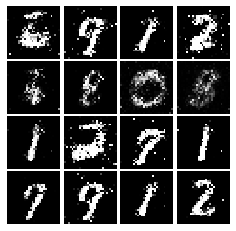

Epoch: 4, Iter: 2340, D: 1.242, G:0.811


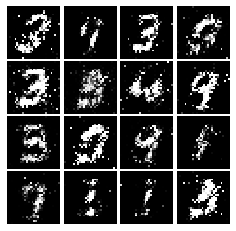

Epoch: 5, Iter: 2360, D: 1.357, G:0.9669


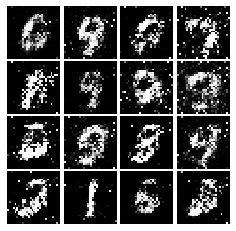

Epoch: 5, Iter: 2380, D: 1.245, G:0.9032


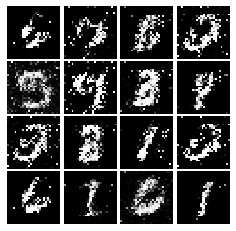

Epoch: 5, Iter: 2400, D: 1.213, G:0.8821


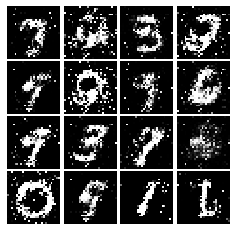

Epoch: 5, Iter: 2420, D: 1.274, G:0.835


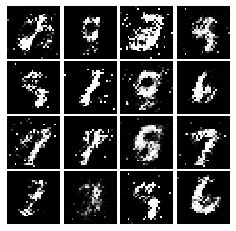

Epoch: 5, Iter: 2440, D: 1.221, G:0.8447


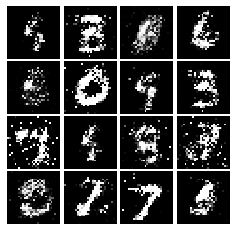

Epoch: 5, Iter: 2460, D: 1.271, G:0.8331


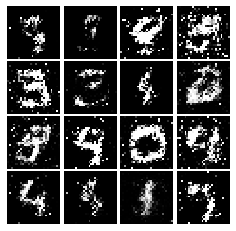

Epoch: 5, Iter: 2480, D: 1.306, G:0.9751


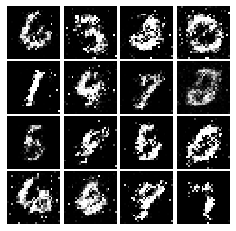

Epoch: 5, Iter: 2500, D: 1.301, G:0.846


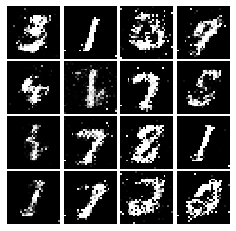

Epoch: 5, Iter: 2520, D: 1.394, G:0.8859


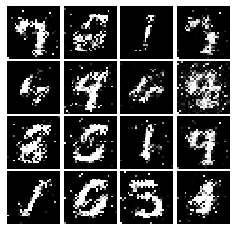

Epoch: 5, Iter: 2540, D: 1.303, G:0.8488


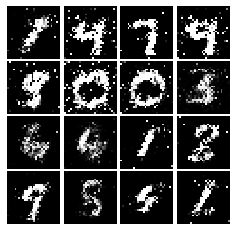

Epoch: 5, Iter: 2560, D: 1.344, G:0.846


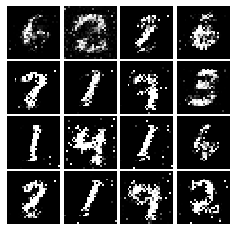

Epoch: 5, Iter: 2580, D: 1.362, G:0.8397


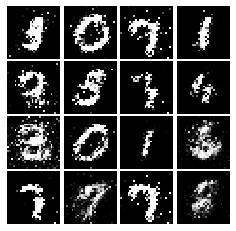

Epoch: 5, Iter: 2600, D: 1.296, G:0.75


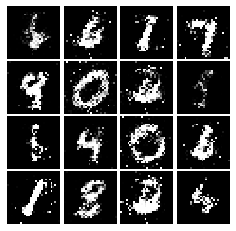

Epoch: 5, Iter: 2620, D: 1.291, G:1.146


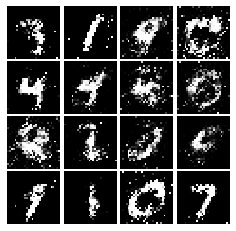

Epoch: 5, Iter: 2640, D: 1.51, G:0.5648


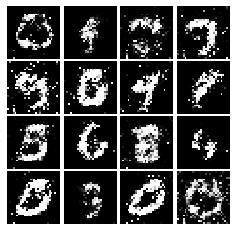

Epoch: 5, Iter: 2660, D: 1.339, G:0.7982


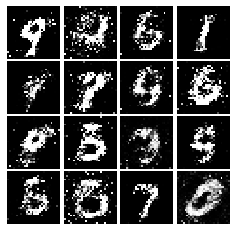

Epoch: 5, Iter: 2680, D: 1.28, G:0.8786


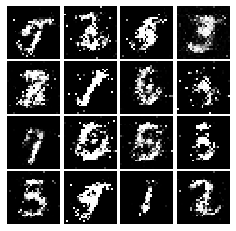

Epoch: 5, Iter: 2700, D: 1.388, G:0.837


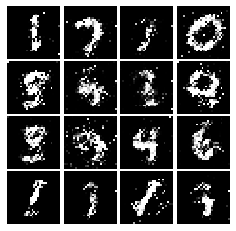

Epoch: 5, Iter: 2720, D: 1.326, G:0.8008


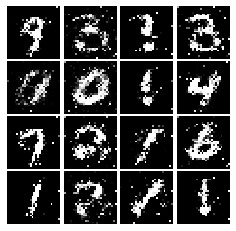

Epoch: 5, Iter: 2740, D: 1.396, G:0.9257


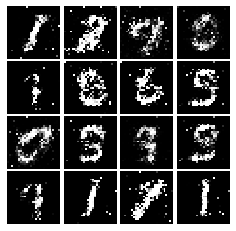

Epoch: 5, Iter: 2760, D: 1.276, G:0.8604


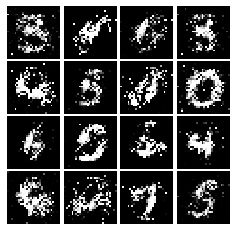

Epoch: 5, Iter: 2780, D: 1.281, G:0.9416


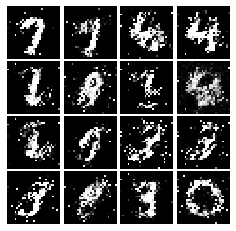

Epoch: 5, Iter: 2800, D: 1.161, G:0.9003


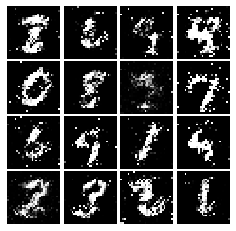

Epoch: 6, Iter: 2820, D: 1.298, G:0.7626


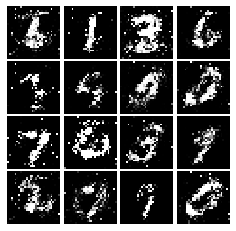

Epoch: 6, Iter: 2840, D: 1.213, G:0.8547


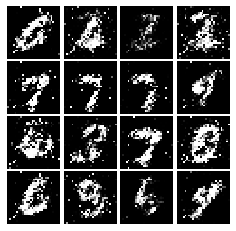

Epoch: 6, Iter: 2860, D: 1.328, G:0.9611


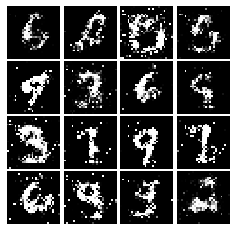

Epoch: 6, Iter: 2880, D: 1.297, G:0.8331


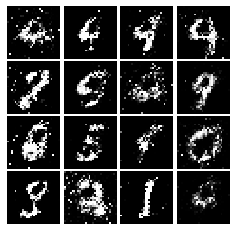

Epoch: 6, Iter: 2900, D: 1.32, G:0.7678


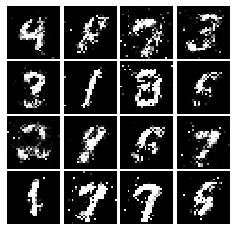

Epoch: 6, Iter: 2920, D: 1.475, G:0.8289


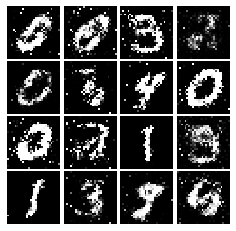

Epoch: 6, Iter: 2940, D: 1.263, G:0.7664


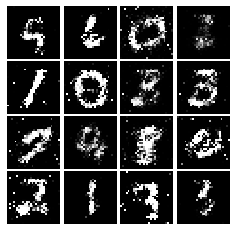

Epoch: 6, Iter: 2960, D: 1.529, G:0.4003


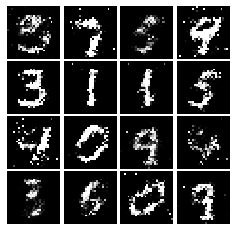

Epoch: 6, Iter: 2980, D: 1.396, G:0.7563


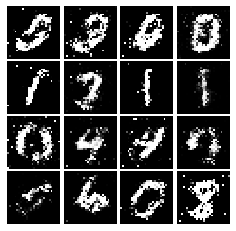

Epoch: 6, Iter: 3000, D: 1.377, G:0.8395


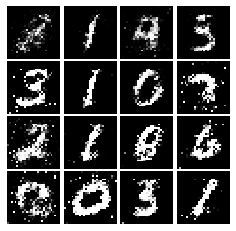

Epoch: 6, Iter: 3020, D: 1.399, G:0.8409


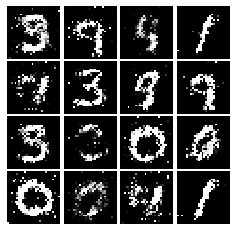

Epoch: 6, Iter: 3040, D: 1.335, G:0.9108


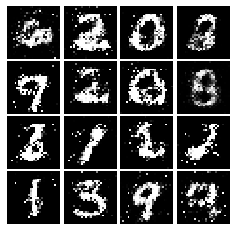

Epoch: 6, Iter: 3060, D: 1.331, G:0.7356


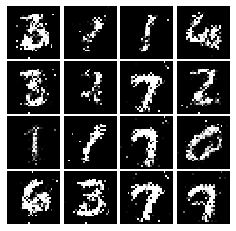

Epoch: 6, Iter: 3080, D: 1.314, G:0.821


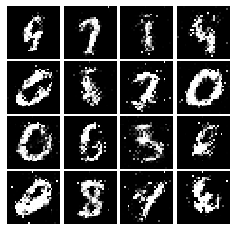

Epoch: 6, Iter: 3100, D: 1.388, G:0.7432


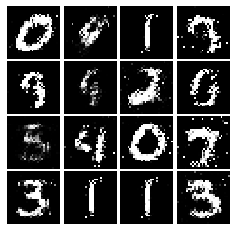

Epoch: 6, Iter: 3120, D: 1.321, G:0.9117


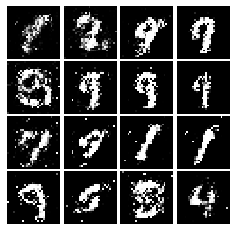

Epoch: 6, Iter: 3140, D: 1.322, G:0.8643


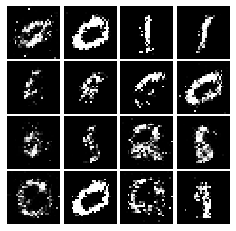

Epoch: 6, Iter: 3160, D: 1.303, G:0.7742


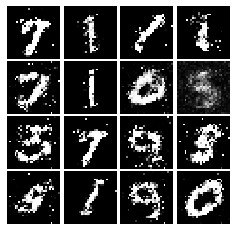

Epoch: 6, Iter: 3180, D: 1.347, G:0.8293


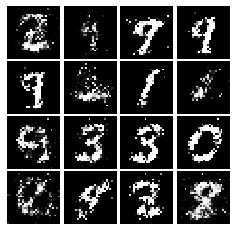

Epoch: 6, Iter: 3200, D: 1.335, G:0.8883


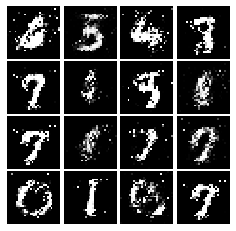

Epoch: 6, Iter: 3220, D: 1.365, G:0.7963


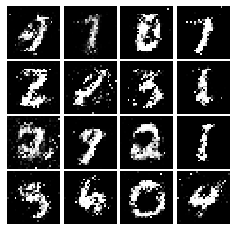

Epoch: 6, Iter: 3240, D: 1.341, G:0.7303


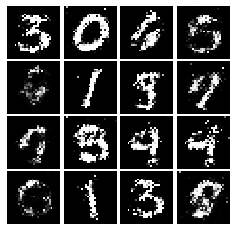

Epoch: 6, Iter: 3260, D: 1.412, G:0.7272


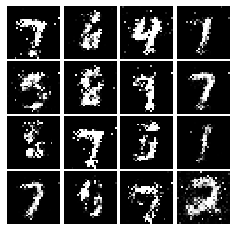

Epoch: 6, Iter: 3280, D: 1.26, G:0.7896


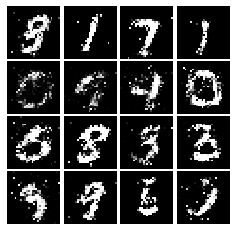

Epoch: 7, Iter: 3300, D: 1.342, G:0.8717


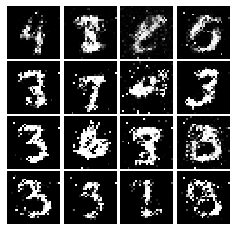

Epoch: 7, Iter: 3320, D: 1.342, G:0.7767


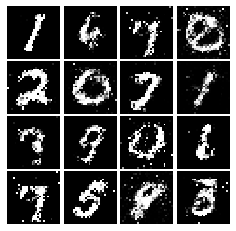

Epoch: 7, Iter: 3340, D: 1.33, G:0.769


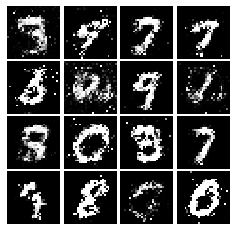

Epoch: 7, Iter: 3360, D: 1.353, G:0.8091


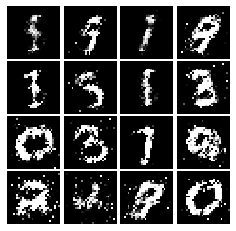

Epoch: 7, Iter: 3380, D: 1.312, G:0.8521


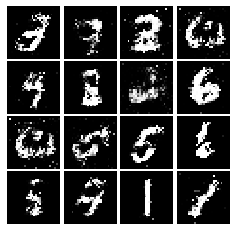

Epoch: 7, Iter: 3400, D: 1.323, G:0.7636


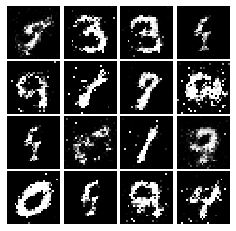

Epoch: 7, Iter: 3420, D: 1.284, G:0.808


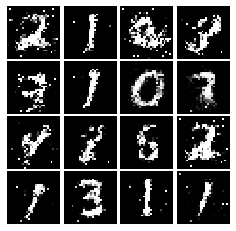

Epoch: 7, Iter: 3440, D: 1.287, G:0.8477


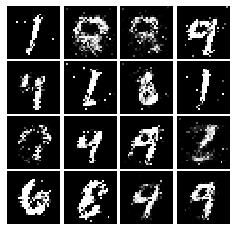

Epoch: 7, Iter: 3460, D: 1.237, G:0.7413


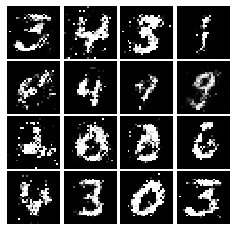

Epoch: 7, Iter: 3480, D: 1.332, G:0.8001


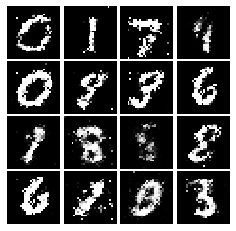

Epoch: 7, Iter: 3500, D: 1.357, G:0.784


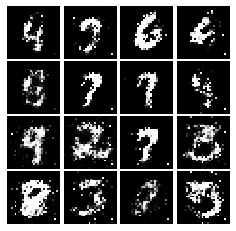

Epoch: 7, Iter: 3520, D: 1.334, G:0.8061


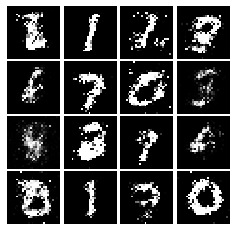

Epoch: 7, Iter: 3540, D: 1.292, G:0.8954


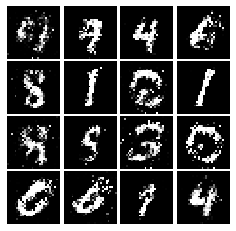

Epoch: 7, Iter: 3560, D: 1.274, G:0.8384


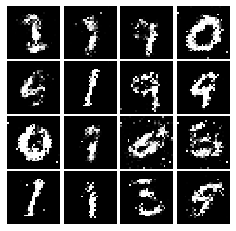

Epoch: 7, Iter: 3580, D: 1.388, G:0.8592


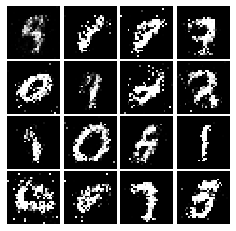

Epoch: 7, Iter: 3600, D: 1.376, G:0.8051


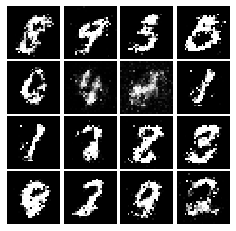

Epoch: 7, Iter: 3620, D: 1.41, G:0.774


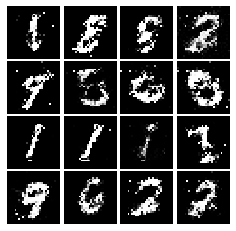

Epoch: 7, Iter: 3640, D: 1.334, G:0.7899


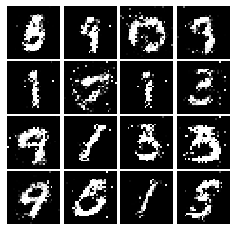

Epoch: 7, Iter: 3660, D: 1.333, G:0.8703


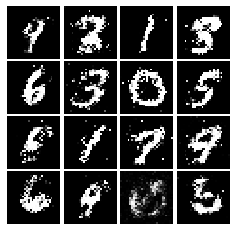

Epoch: 7, Iter: 3680, D: 1.306, G:0.8132


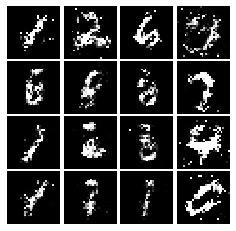

Epoch: 7, Iter: 3700, D: 1.402, G:0.7819


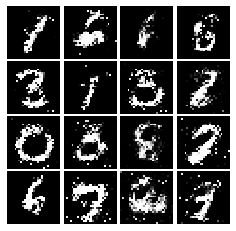

Epoch: 7, Iter: 3720, D: 1.253, G:0.7435


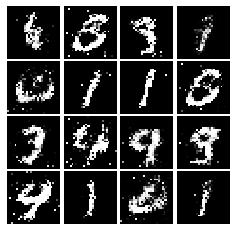

Epoch: 7, Iter: 3740, D: 1.472, G:0.8025


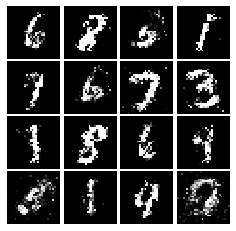

Epoch: 8, Iter: 3760, D: 1.331, G:0.7651


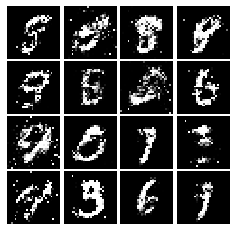

Epoch: 8, Iter: 3780, D: 1.342, G:0.7094


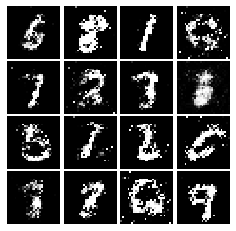

Epoch: 8, Iter: 3800, D: 1.321, G:0.8988


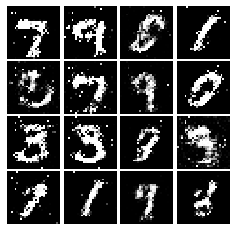

Epoch: 8, Iter: 3820, D: 1.353, G:0.7559


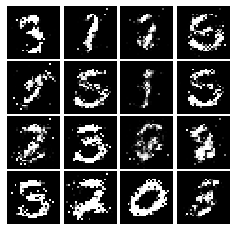

Epoch: 8, Iter: 3840, D: 1.352, G:0.875


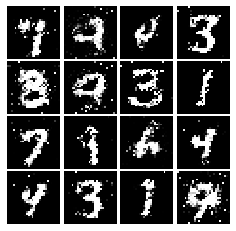

Epoch: 8, Iter: 3860, D: 1.323, G:0.778


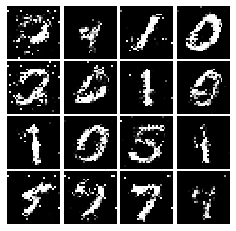

Epoch: 8, Iter: 3880, D: 1.296, G:0.7854


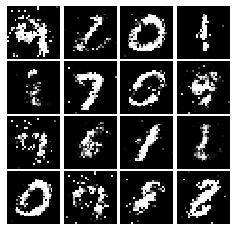

Epoch: 8, Iter: 3900, D: 1.341, G:0.7583


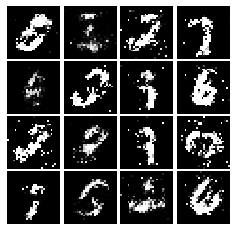

Epoch: 8, Iter: 3920, D: 1.314, G:0.7896


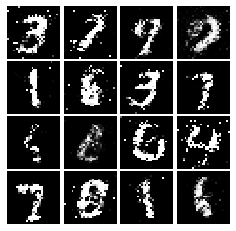

Epoch: 8, Iter: 3940, D: 1.368, G:0.8163


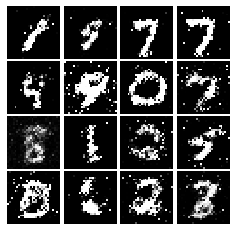

Epoch: 8, Iter: 3960, D: 1.338, G:0.8911


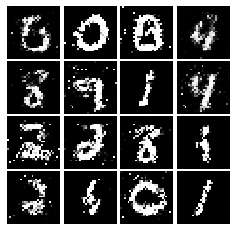

Epoch: 8, Iter: 3980, D: 1.324, G:0.805


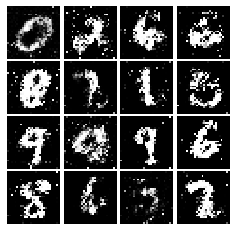

Epoch: 8, Iter: 4000, D: 1.302, G:0.8107


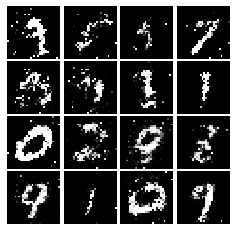

Epoch: 8, Iter: 4020, D: 1.421, G:0.8246


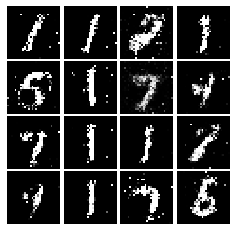

Epoch: 8, Iter: 4040, D: 1.318, G:0.7967


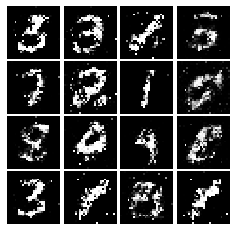

Epoch: 8, Iter: 4060, D: 1.363, G:0.7954


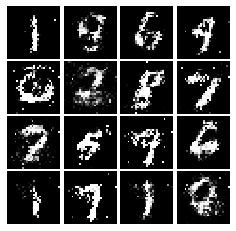

Epoch: 8, Iter: 4080, D: 1.357, G:0.7314


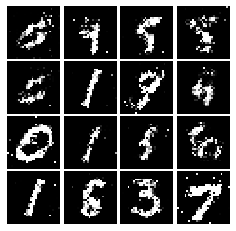

Epoch: 8, Iter: 4100, D: 1.36, G:0.7531


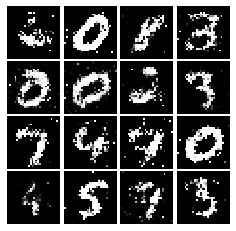

Epoch: 8, Iter: 4120, D: 1.385, G:0.7426


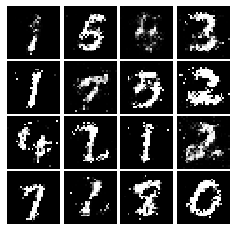

Epoch: 8, Iter: 4140, D: 1.264, G:0.7532


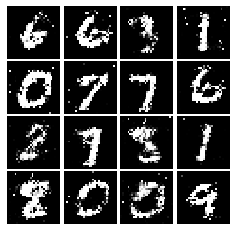

Epoch: 8, Iter: 4160, D: 1.352, G:0.747


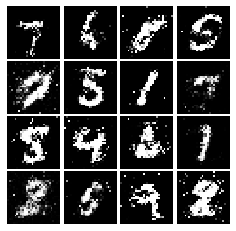

Epoch: 8, Iter: 4180, D: 1.369, G:0.8979


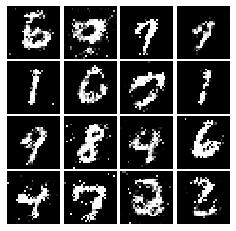

Epoch: 8, Iter: 4200, D: 1.385, G:0.728


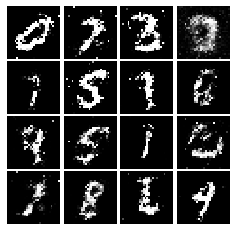

Epoch: 8, Iter: 4220, D: 1.398, G:0.7386


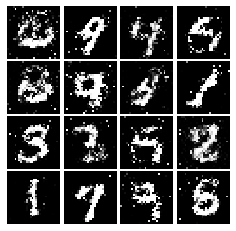

Epoch: 9, Iter: 4240, D: 1.313, G:0.7416


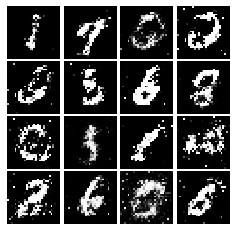

Epoch: 9, Iter: 4260, D: 1.361, G:0.7822


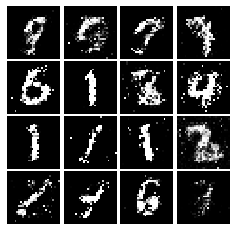

Epoch: 9, Iter: 4280, D: 1.389, G:0.7978


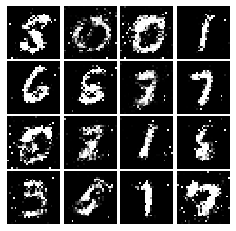

Epoch: 9, Iter: 4300, D: 1.4, G:0.7611


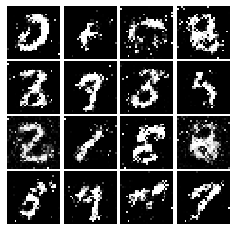

Epoch: 9, Iter: 4320, D: 1.349, G:0.7709


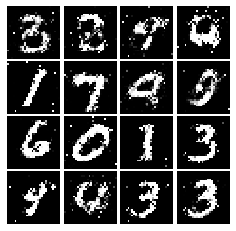

Epoch: 9, Iter: 4340, D: 1.363, G:0.7783


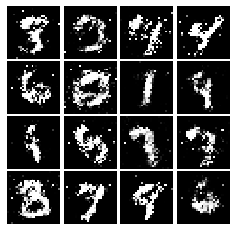

Epoch: 9, Iter: 4360, D: 1.341, G:0.7567


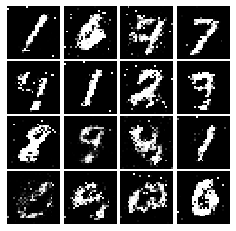

Epoch: 9, Iter: 4380, D: 1.405, G:0.8004


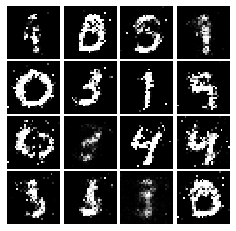

Epoch: 9, Iter: 4400, D: 1.311, G:0.8214


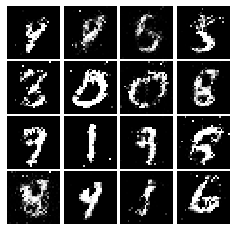

Epoch: 9, Iter: 4420, D: 1.303, G:0.754


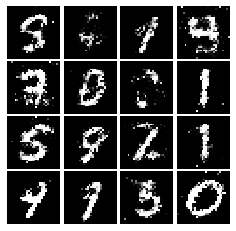

Epoch: 9, Iter: 4440, D: 1.398, G:0.8337


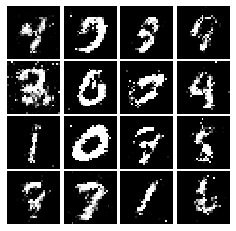

Epoch: 9, Iter: 4460, D: 1.325, G:0.7442


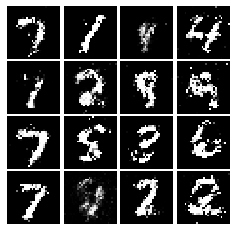

Epoch: 9, Iter: 4480, D: 1.332, G:0.7615


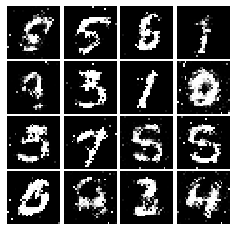

Epoch: 9, Iter: 4500, D: 1.438, G:0.8561


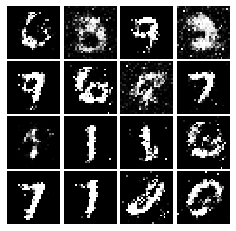

Epoch: 9, Iter: 4520, D: 1.333, G:0.8101


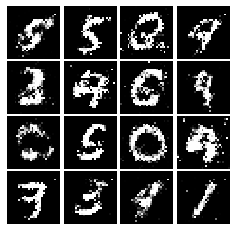

Epoch: 9, Iter: 4540, D: 1.397, G:0.8214


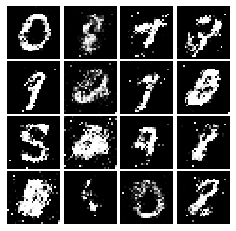

Epoch: 9, Iter: 4560, D: 1.403, G:0.8154


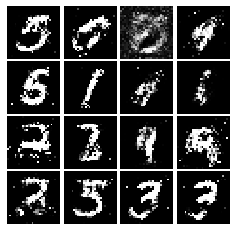

Epoch: 9, Iter: 4580, D: 1.286, G:0.8595


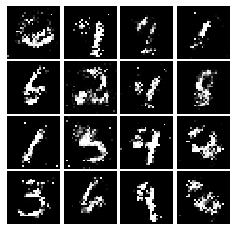

Epoch: 9, Iter: 4600, D: 1.394, G:0.7666


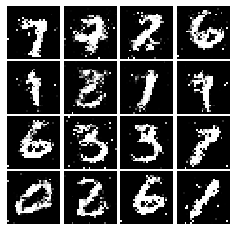

Epoch: 9, Iter: 4620, D: 1.284, G:0.716


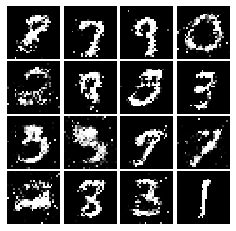

Epoch: 9, Iter: 4640, D: 1.295, G:0.7962


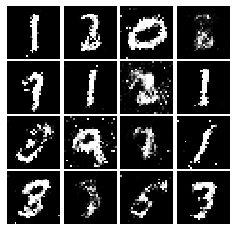

Epoch: 9, Iter: 4660, D: 1.332, G:0.8267


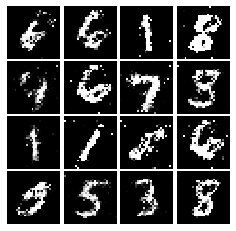

Epoch: 9, Iter: 4680, D: 1.31, G:0.7415


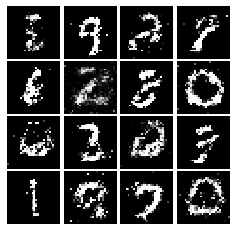

Final images


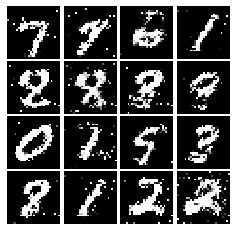

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [19]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.reduce_mean((scores_real - tf.ones_like(scores_real)) ** 2) +  tf.reduce_mean(scores_fake ** 2))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - tf.ones_like(scores_fake)) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [20]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.01, G:0.386


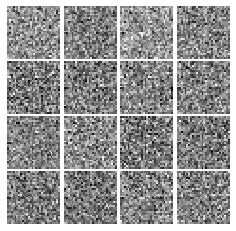

Epoch: 0, Iter: 20, D: 0.03849, G:0.825


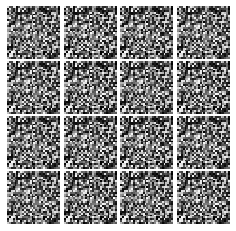

Epoch: 0, Iter: 40, D: 0.0215, G:0.5715


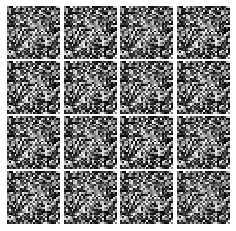

Epoch: 0, Iter: 60, D: 0.05569, G:0.8928


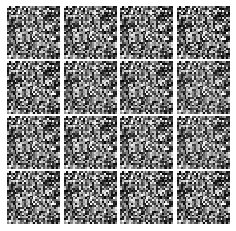

Epoch: 0, Iter: 80, D: 0.05109, G:0.4998


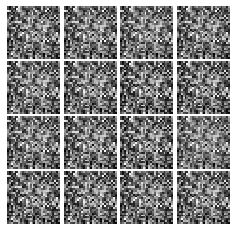

Epoch: 0, Iter: 100, D: 0.1824, G:1.436


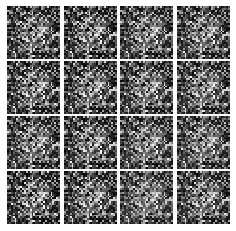

Epoch: 0, Iter: 120, D: 0.04263, G:0.5895


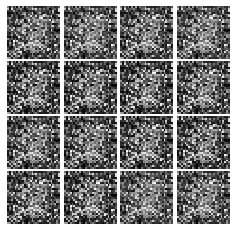

Epoch: 0, Iter: 140, D: 0.1096, G:1.918


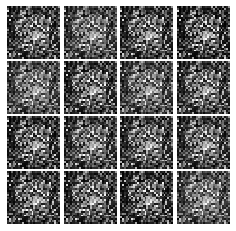

Epoch: 0, Iter: 160, D: 0.162, G:0.2956


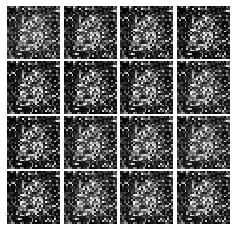

Epoch: 0, Iter: 180, D: 0.3973, G:1.451


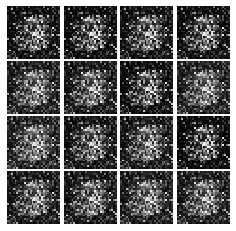

Epoch: 0, Iter: 200, D: 0.1643, G:0.7607


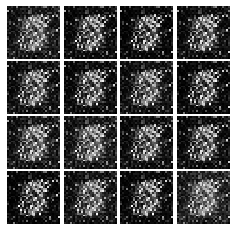

Epoch: 0, Iter: 220, D: 0.5525, G:0.5956


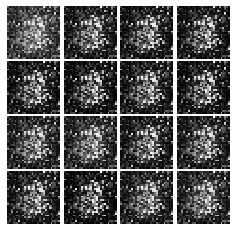

Epoch: 0, Iter: 240, D: 0.1631, G:0.8178


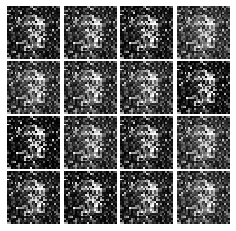

Epoch: 0, Iter: 260, D: 0.138, G:0.4465


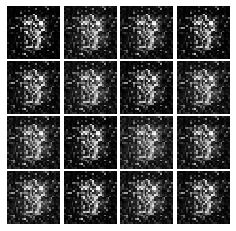

Epoch: 0, Iter: 280, D: 0.1615, G:0.1907


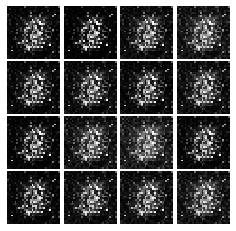

Epoch: 0, Iter: 300, D: 0.1079, G:0.7623


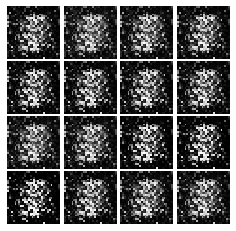

Epoch: 0, Iter: 320, D: 0.05802, G:0.7393


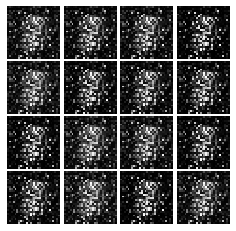

Epoch: 0, Iter: 340, D: 0.09753, G:0.6504


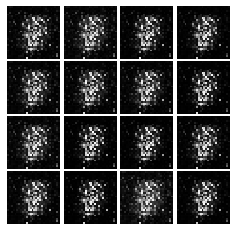

Epoch: 0, Iter: 360, D: 0.2295, G:0.6028


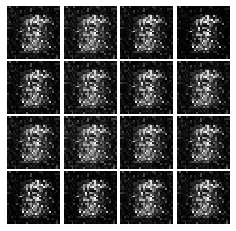

Epoch: 0, Iter: 380, D: 0.1099, G:0.5791


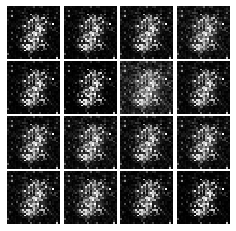

Epoch: 0, Iter: 400, D: 0.09527, G:0.3859


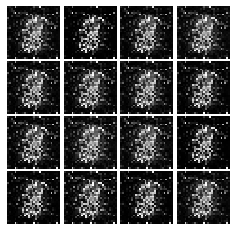

Epoch: 0, Iter: 420, D: 0.0684, G:0.503


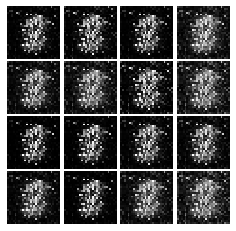

Epoch: 0, Iter: 440, D: 0.1088, G:0.3239


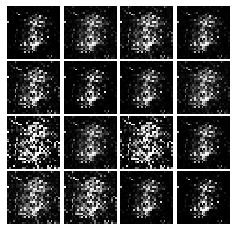

Epoch: 0, Iter: 460, D: 0.06228, G:0.5646


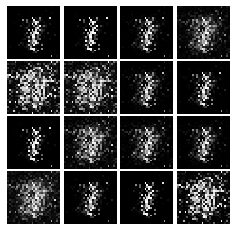

Epoch: 1, Iter: 480, D: 0.1292, G:0.3289


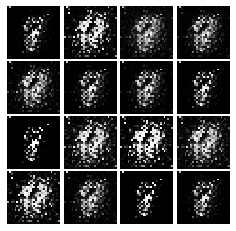

Epoch: 1, Iter: 500, D: 0.08639, G:0.4772


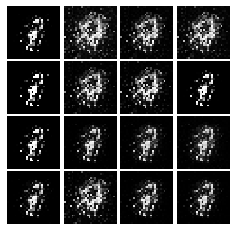

Epoch: 1, Iter: 520, D: 0.2498, G:1.072


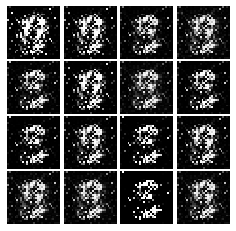

Epoch: 1, Iter: 540, D: 0.24, G:1.789


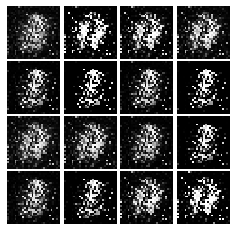

Epoch: 1, Iter: 560, D: 0.1342, G:0.3279


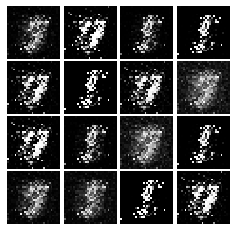

Epoch: 1, Iter: 580, D: 0.1033, G:0.3391


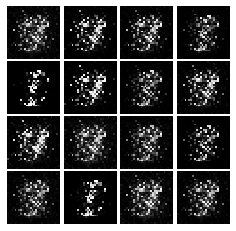

Epoch: 1, Iter: 600, D: 0.1447, G:0.4346


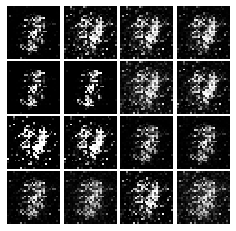

Epoch: 1, Iter: 620, D: 0.06913, G:0.4588


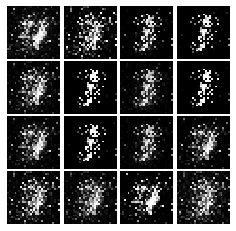

Epoch: 1, Iter: 640, D: 0.1462, G:0.4519


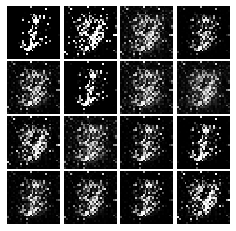

Epoch: 1, Iter: 660, D: 0.1028, G:0.3993


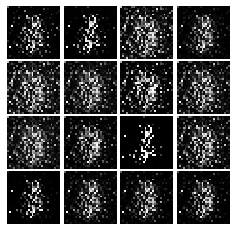

Epoch: 1, Iter: 680, D: 0.2395, G:0.1945


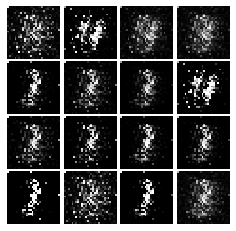

Epoch: 1, Iter: 700, D: 0.151, G:0.3393


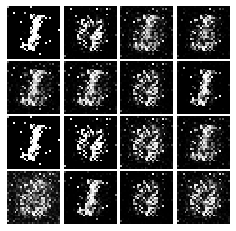

Epoch: 1, Iter: 720, D: 0.1115, G:0.3622


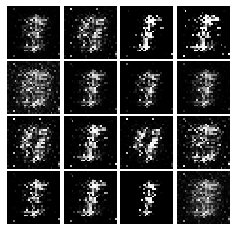

Epoch: 1, Iter: 740, D: 0.1166, G:0.3185


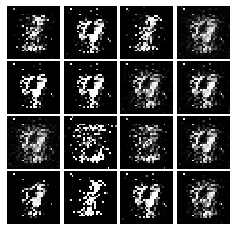

Epoch: 1, Iter: 760, D: 0.08065, G:0.4144


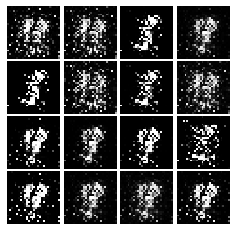

Epoch: 1, Iter: 780, D: 0.1106, G:0.4224


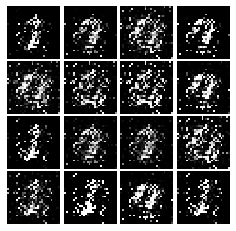

Epoch: 1, Iter: 800, D: 0.07945, G:0.734


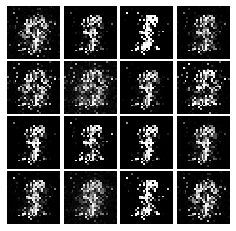

Epoch: 1, Iter: 820, D: 0.1259, G:0.3379


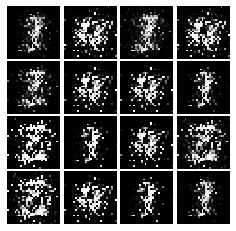

Epoch: 1, Iter: 840, D: 0.1638, G:0.1719


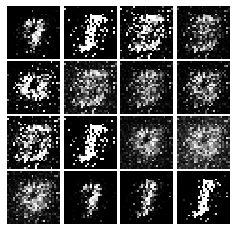

Epoch: 1, Iter: 860, D: 0.1087, G:0.5621


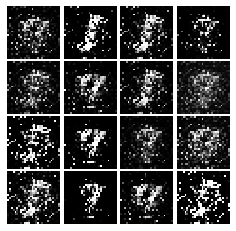

Epoch: 1, Iter: 880, D: 0.1494, G:0.3005


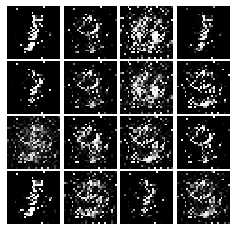

Epoch: 1, Iter: 900, D: 0.1612, G:0.5127


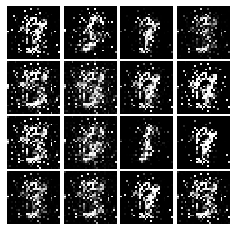

Epoch: 1, Iter: 920, D: 0.1865, G:0.3734


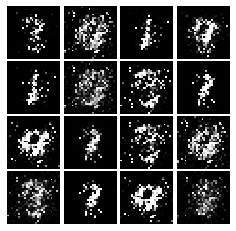

Epoch: 2, Iter: 940, D: 0.1587, G:0.3164


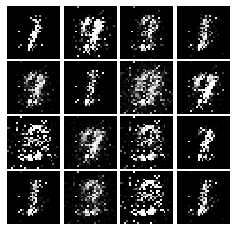

Epoch: 2, Iter: 960, D: 0.1844, G:0.4487


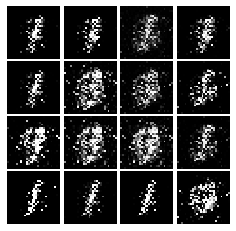

Epoch: 2, Iter: 980, D: 0.1392, G:0.3585


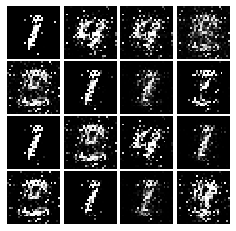

Epoch: 2, Iter: 1000, D: 0.1451, G:0.3525


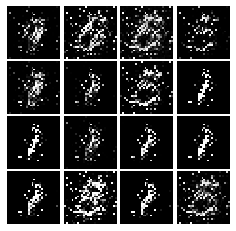

Epoch: 2, Iter: 1020, D: 0.1508, G:0.2902


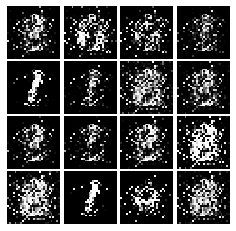

Epoch: 2, Iter: 1040, D: 0.108, G:0.3806


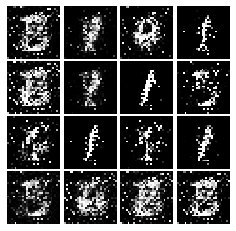

Epoch: 2, Iter: 1060, D: 0.2135, G:0.2977


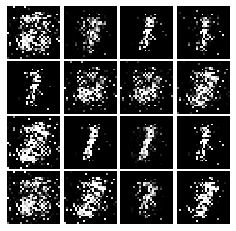

Epoch: 2, Iter: 1080, D: 0.1675, G:0.2312


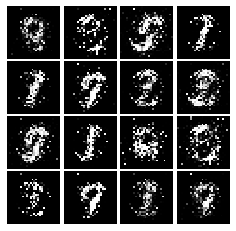

Epoch: 2, Iter: 1100, D: 0.1828, G:0.2067


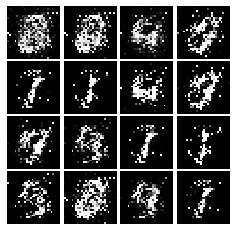

Epoch: 2, Iter: 1120, D: 0.1527, G:0.3087


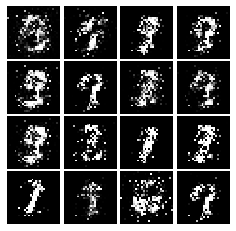

Epoch: 2, Iter: 1140, D: 0.2251, G:0.2114


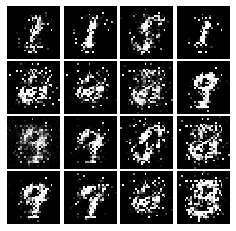

Epoch: 2, Iter: 1160, D: 0.2119, G:0.2191


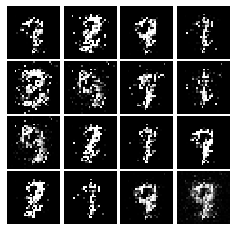

Epoch: 2, Iter: 1180, D: 0.1885, G:0.1938


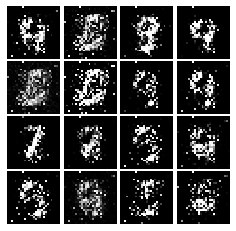

Epoch: 2, Iter: 1200, D: 0.1874, G:0.234


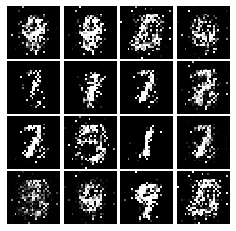

Epoch: 2, Iter: 1220, D: 0.2021, G:0.303


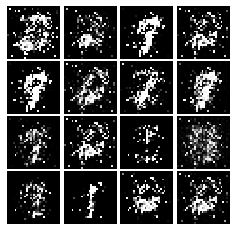

Epoch: 2, Iter: 1240, D: 0.1395, G:0.2858


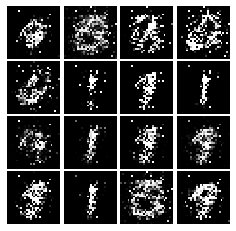

Epoch: 2, Iter: 1260, D: 0.2113, G:0.2301


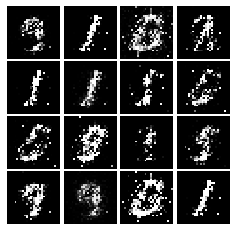

Epoch: 2, Iter: 1280, D: 0.1765, G:0.2314


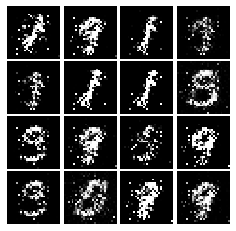

Epoch: 2, Iter: 1300, D: 0.1685, G:0.2162


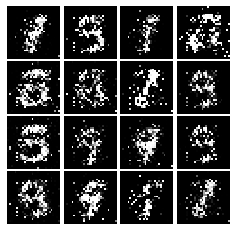

Epoch: 2, Iter: 1320, D: 0.1763, G:0.2746


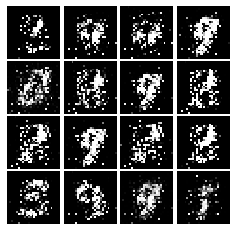

Epoch: 2, Iter: 1340, D: 0.1533, G:0.2917


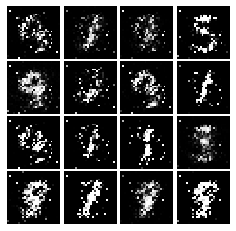

Epoch: 2, Iter: 1360, D: 0.1386, G:0.2899


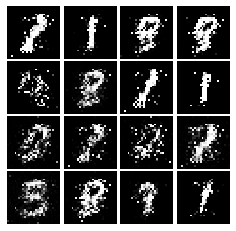

Epoch: 2, Iter: 1380, D: 0.1398, G:0.535


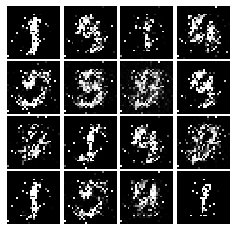

Epoch: 2, Iter: 1400, D: 0.09948, G:0.3718


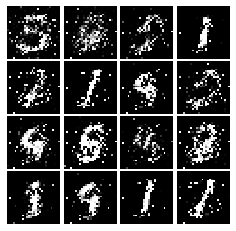

Epoch: 3, Iter: 1420, D: 0.1455, G:0.3457


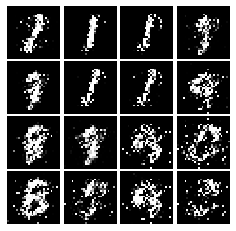

Epoch: 3, Iter: 1440, D: 0.1496, G:0.2877


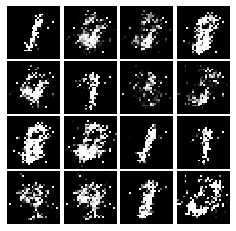

Epoch: 3, Iter: 1460, D: 0.1652, G:0.2959


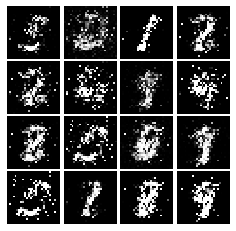

Epoch: 3, Iter: 1480, D: 0.1544, G:0.2391


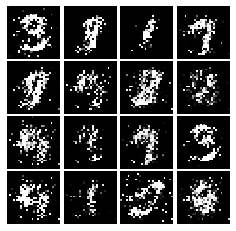

Epoch: 3, Iter: 1500, D: 0.2128, G:0.2533


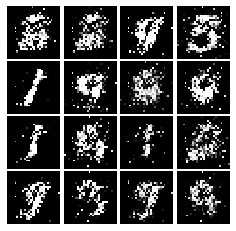

Epoch: 3, Iter: 1520, D: 0.2686, G:0.2175


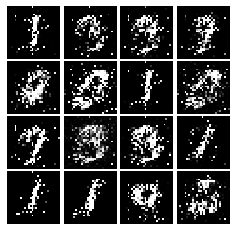

Epoch: 3, Iter: 1540, D: 0.1522, G:0.2992


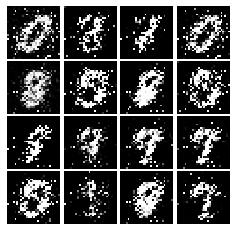

Epoch: 3, Iter: 1560, D: 0.1652, G:0.2447


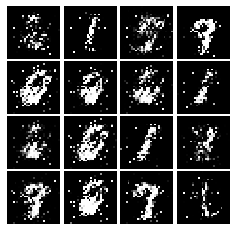

Epoch: 3, Iter: 1580, D: 0.2594, G:0.2689


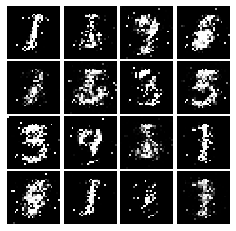

Epoch: 3, Iter: 1600, D: 0.1922, G:0.2307


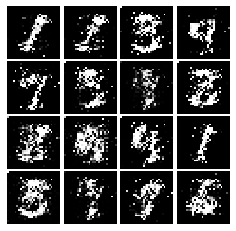

Epoch: 3, Iter: 1620, D: 0.1183, G:0.3018


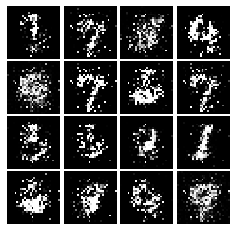

Epoch: 3, Iter: 1640, D: 0.1625, G:0.265


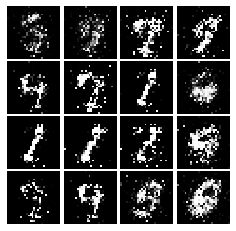

Epoch: 3, Iter: 1660, D: 0.1459, G:0.4275


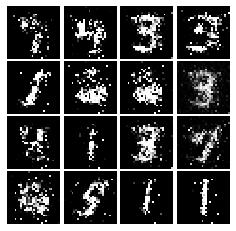

Epoch: 3, Iter: 1680, D: 0.1809, G:0.2495


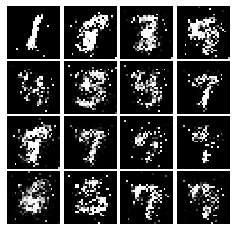

Epoch: 3, Iter: 1700, D: 0.1931, G:0.2152


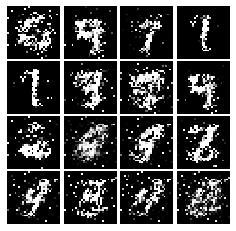

Epoch: 3, Iter: 1720, D: 0.1927, G:0.2724


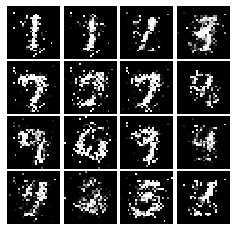

Epoch: 3, Iter: 1740, D: 0.1625, G:0.2328


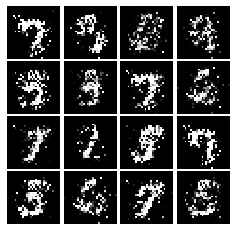

Epoch: 3, Iter: 1760, D: 0.1601, G:0.2209


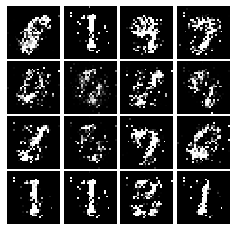

Epoch: 3, Iter: 1780, D: 0.2053, G:0.05354


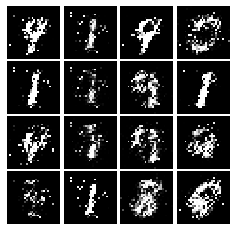

Epoch: 3, Iter: 1800, D: 0.2301, G:0.2486


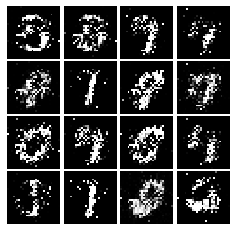

Epoch: 3, Iter: 1820, D: 0.155, G:0.2267


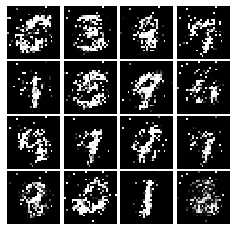

Epoch: 3, Iter: 1840, D: 0.1733, G:0.2531


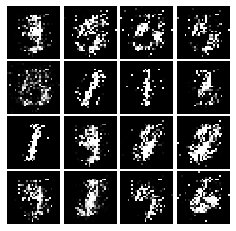

Epoch: 3, Iter: 1860, D: 0.196, G:0.2527


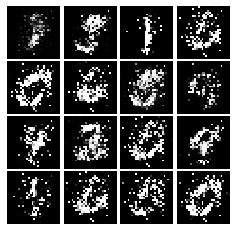

Epoch: 4, Iter: 1880, D: 0.2148, G:0.2238


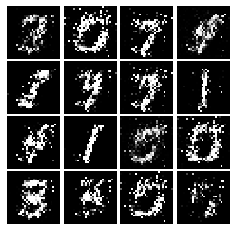

Epoch: 4, Iter: 1900, D: 0.1906, G:0.2312


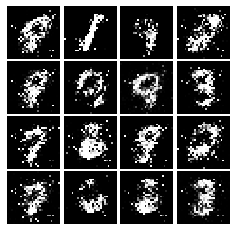

Epoch: 4, Iter: 1920, D: 0.1954, G:0.1593


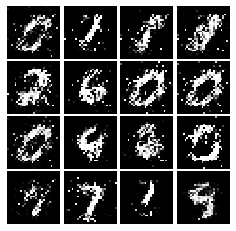

Epoch: 4, Iter: 1940, D: 0.2178, G:0.1693


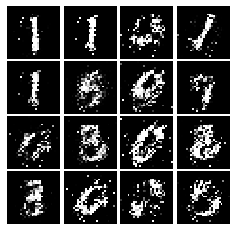

Epoch: 4, Iter: 1960, D: 0.1847, G:0.2403


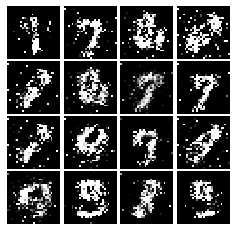

Epoch: 4, Iter: 1980, D: 0.169, G:0.3446


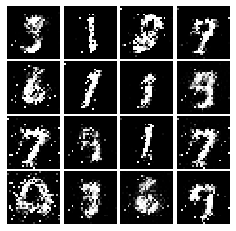

Epoch: 4, Iter: 2000, D: 0.2155, G:0.2156


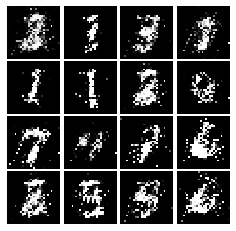

Epoch: 4, Iter: 2020, D: 0.2064, G:0.276


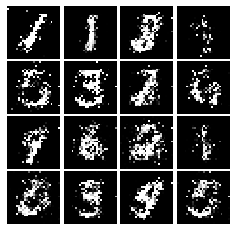

Epoch: 4, Iter: 2040, D: 0.2059, G:0.171


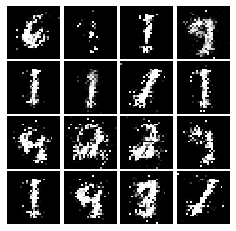

Epoch: 4, Iter: 2060, D: 0.2708, G:0.07777


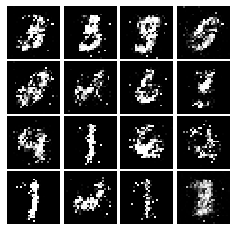

Epoch: 4, Iter: 2080, D: 0.2144, G:0.1435


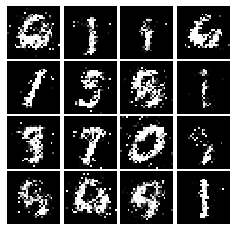

Epoch: 4, Iter: 2100, D: 0.2169, G:0.1996


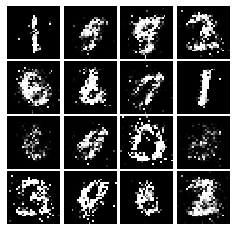

Epoch: 4, Iter: 2120, D: 0.1896, G:0.1976


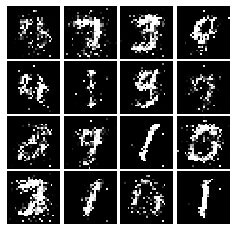

Epoch: 4, Iter: 2140, D: 0.2186, G:0.1943


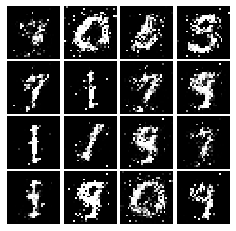

Epoch: 4, Iter: 2160, D: 0.2348, G:0.1548


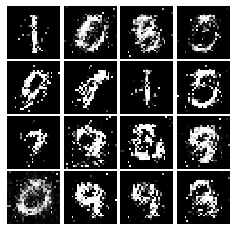

Epoch: 4, Iter: 2180, D: 0.2152, G:0.1803


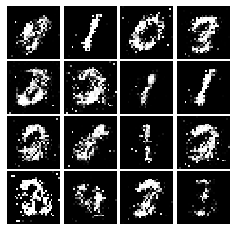

Epoch: 4, Iter: 2200, D: 0.2017, G:0.2236


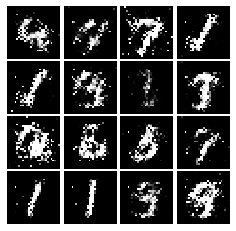

Epoch: 4, Iter: 2220, D: 0.2133, G:0.1881


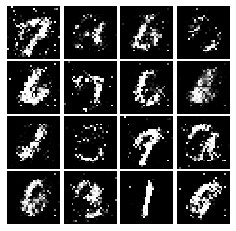

Epoch: 4, Iter: 2240, D: 0.2612, G:0.1889


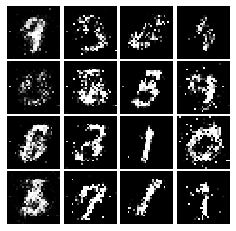

Epoch: 4, Iter: 2260, D: 0.2176, G:0.2001


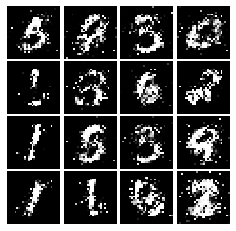

Epoch: 4, Iter: 2280, D: 0.2441, G:0.2176


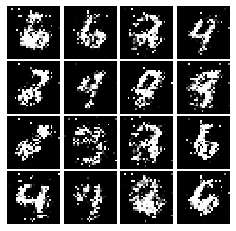

Epoch: 4, Iter: 2300, D: 0.2078, G:0.176


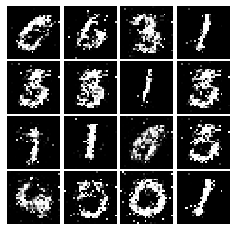

Epoch: 4, Iter: 2320, D: 0.2214, G:0.1857


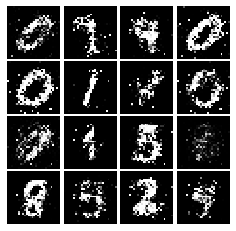

Epoch: 4, Iter: 2340, D: 0.2107, G:0.233


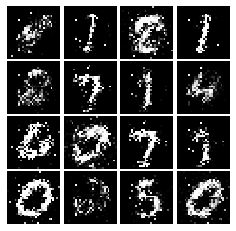

Epoch: 5, Iter: 2360, D: 0.2013, G:0.2061


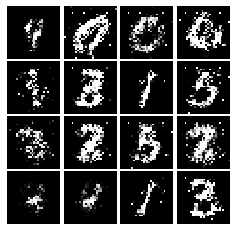

Epoch: 5, Iter: 2380, D: 0.2329, G:0.1537


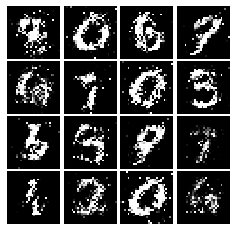

Epoch: 5, Iter: 2400, D: 0.1964, G:0.2208


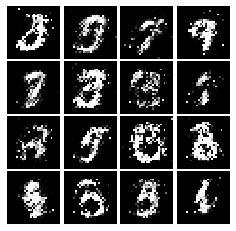

Epoch: 5, Iter: 2420, D: 0.2186, G:0.2208


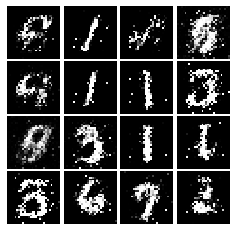

Epoch: 5, Iter: 2440, D: 0.2257, G:0.1612


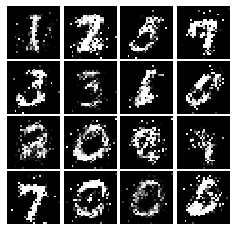

Epoch: 5, Iter: 2460, D: 0.1775, G:0.2212


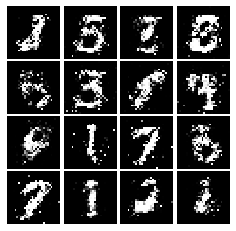

Epoch: 5, Iter: 2480, D: 0.2217, G:0.1902


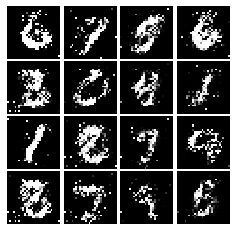

Epoch: 5, Iter: 2500, D: 0.2092, G:0.1775


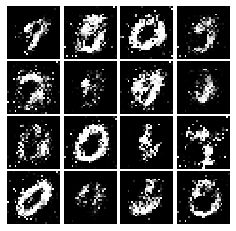

Epoch: 5, Iter: 2520, D: 0.2567, G:0.215


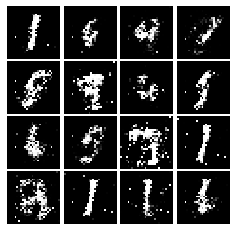

Epoch: 5, Iter: 2540, D: 0.2364, G:0.1835


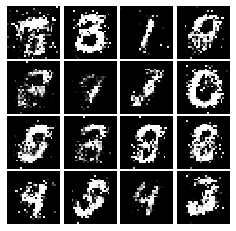

Epoch: 5, Iter: 2560, D: 0.2387, G:0.1915


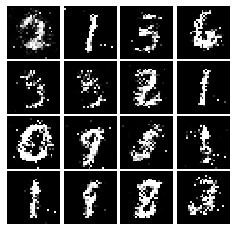

Epoch: 5, Iter: 2580, D: 0.2096, G:0.166


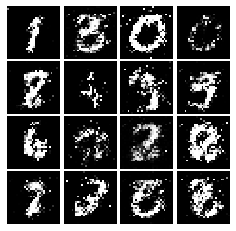

Epoch: 5, Iter: 2600, D: 0.2644, G:0.1506


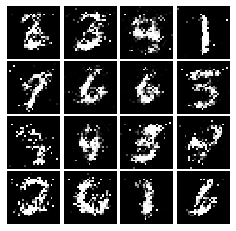

Epoch: 5, Iter: 2620, D: 0.2175, G:0.1875


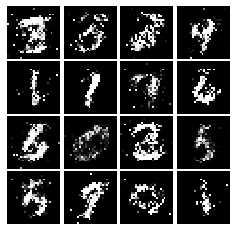

Epoch: 5, Iter: 2640, D: 0.2209, G:0.1726


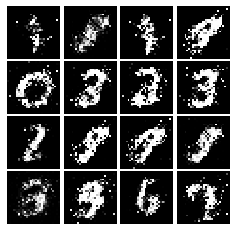

Epoch: 5, Iter: 2660, D: 0.2111, G:0.1682


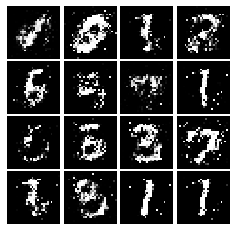

Epoch: 5, Iter: 2680, D: 0.2578, G:0.1752


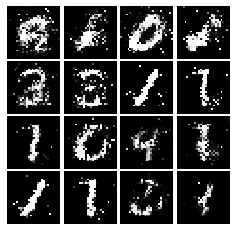

Epoch: 5, Iter: 2700, D: 0.2354, G:0.1993


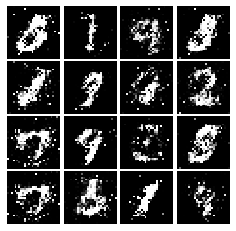

Epoch: 5, Iter: 2720, D: 0.213, G:0.1842


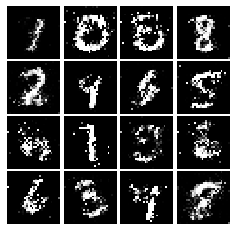

Epoch: 5, Iter: 2740, D: 0.2269, G:0.1898


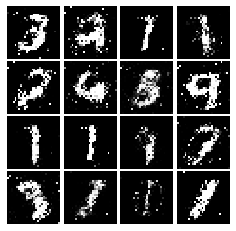

Epoch: 5, Iter: 2760, D: 0.2226, G:0.185


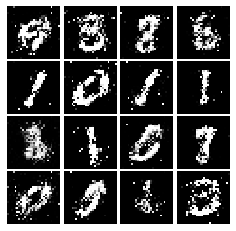

Epoch: 5, Iter: 2780, D: 0.2132, G:0.169


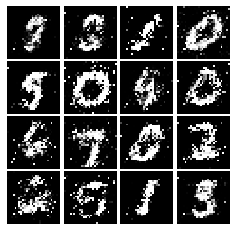

Epoch: 5, Iter: 2800, D: 0.1831, G:0.218


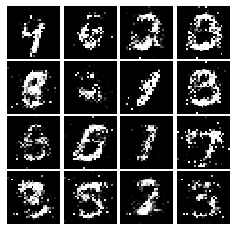

Epoch: 6, Iter: 2820, D: 0.2104, G:0.1776


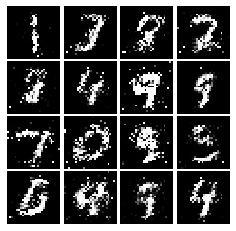

Epoch: 6, Iter: 2840, D: 0.2102, G:0.1771


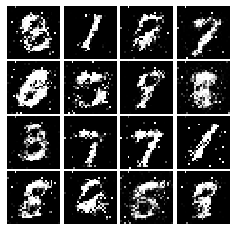

Epoch: 6, Iter: 2860, D: 0.1881, G:0.2098


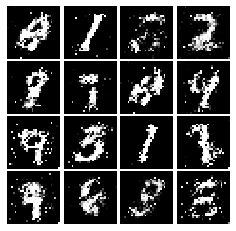

Epoch: 6, Iter: 2880, D: 0.2104, G:0.1913


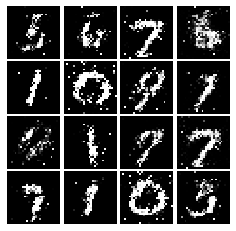

Epoch: 6, Iter: 2900, D: 0.2157, G:0.1957


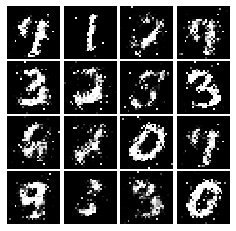

Epoch: 6, Iter: 2920, D: 0.2288, G:0.1669


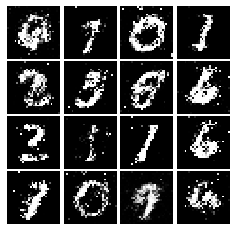

Epoch: 6, Iter: 2940, D: 0.2048, G:0.2015


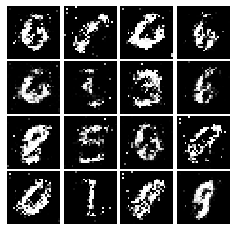

Epoch: 6, Iter: 2960, D: 0.1973, G:0.222


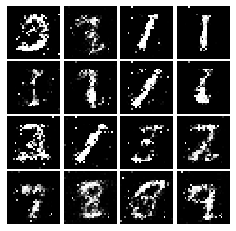

Epoch: 6, Iter: 2980, D: 0.2311, G:0.1688


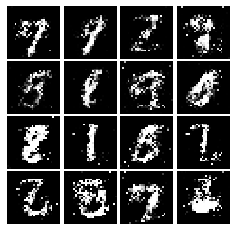

Epoch: 6, Iter: 3000, D: 0.2048, G:0.2224


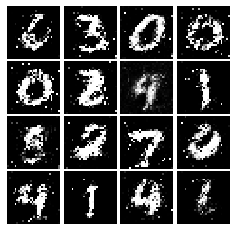

Epoch: 6, Iter: 3020, D: 0.2188, G:0.1734


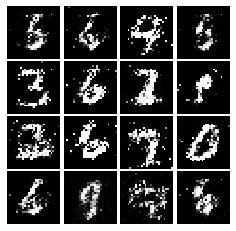

Epoch: 6, Iter: 3040, D: 0.2184, G:0.1771


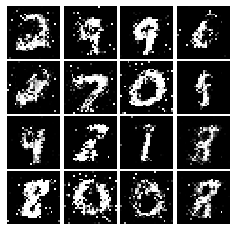

Epoch: 6, Iter: 3060, D: 0.2072, G:0.1907


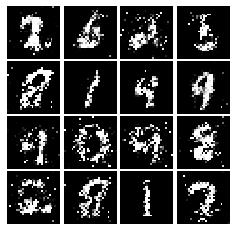

Epoch: 6, Iter: 3080, D: 0.207, G:0.1804


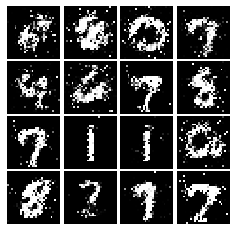

Epoch: 6, Iter: 3100, D: 0.2197, G:0.1751


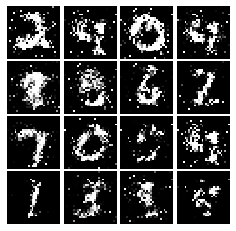

Epoch: 6, Iter: 3120, D: 0.2184, G:0.153


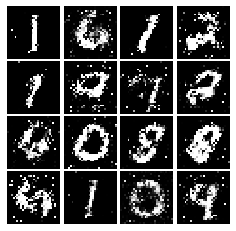

Epoch: 6, Iter: 3140, D: 0.236, G:0.1755


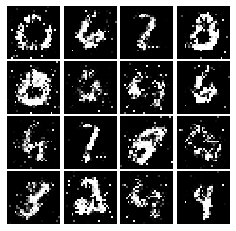

Epoch: 6, Iter: 3160, D: 0.2048, G:0.1921


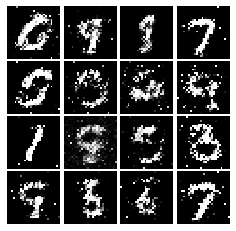

Epoch: 6, Iter: 3180, D: 0.2163, G:0.1931


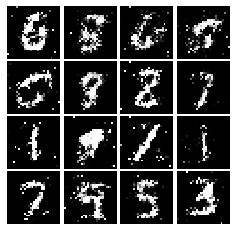

Epoch: 6, Iter: 3200, D: 0.2175, G:0.1687


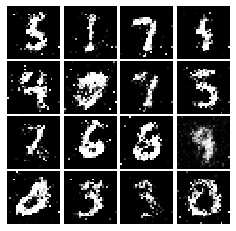

Epoch: 6, Iter: 3220, D: 0.2382, G:0.1795


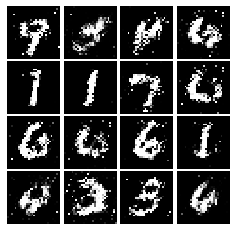

Epoch: 6, Iter: 3240, D: 0.1909, G:0.2689


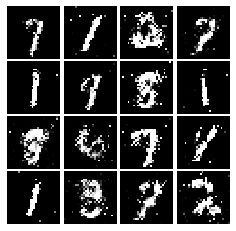

Epoch: 6, Iter: 3260, D: 0.2599, G:0.1943


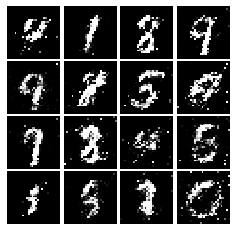

Epoch: 6, Iter: 3280, D: 0.2308, G:0.1961


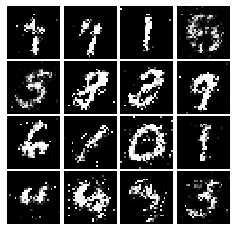

Epoch: 7, Iter: 3300, D: 0.2268, G:0.1828


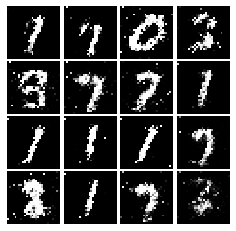

Epoch: 7, Iter: 3320, D: 0.2127, G:0.1839


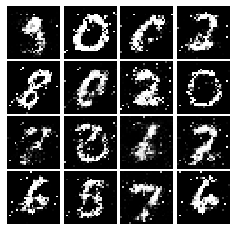

Epoch: 7, Iter: 3340, D: 0.2408, G:0.201


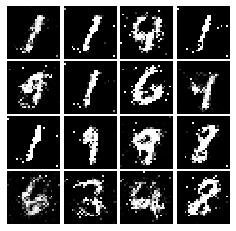

Epoch: 7, Iter: 3360, D: 0.2233, G:0.1494


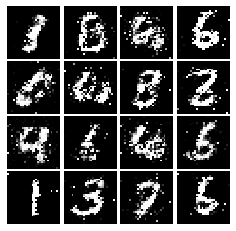

Epoch: 7, Iter: 3380, D: 0.2188, G:0.1703


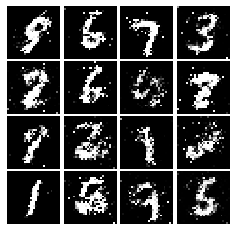

Epoch: 7, Iter: 3400, D: 0.2309, G:0.1797


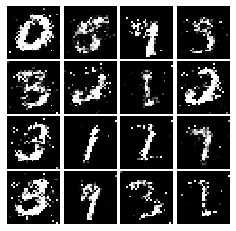

Epoch: 7, Iter: 3420, D: 0.218, G:0.1871


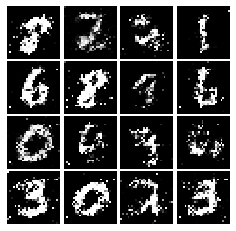

Epoch: 7, Iter: 3440, D: 0.2251, G:0.172


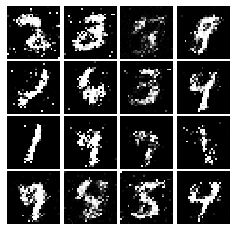

Epoch: 7, Iter: 3460, D: 0.2423, G:0.1673


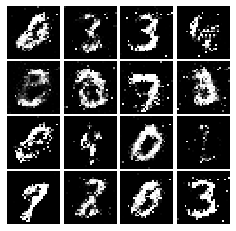

Epoch: 7, Iter: 3480, D: 0.2645, G:0.1516


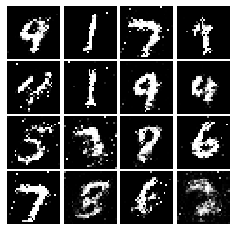

Epoch: 7, Iter: 3500, D: 0.2173, G:0.181


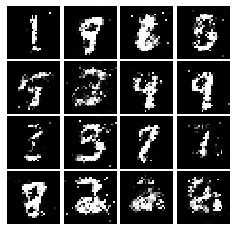

Epoch: 7, Iter: 3520, D: 0.2382, G:0.1744


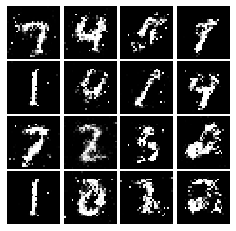

Epoch: 7, Iter: 3540, D: 0.1851, G:0.2118


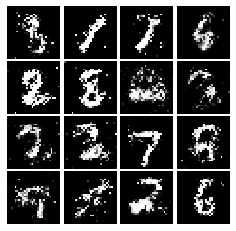

Epoch: 7, Iter: 3560, D: 0.2132, G:0.1927


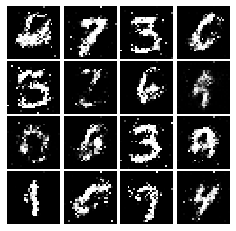

Epoch: 7, Iter: 3580, D: 0.2041, G:0.1759


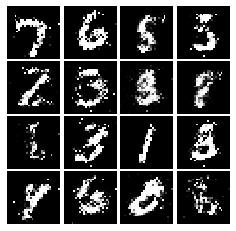

Epoch: 7, Iter: 3600, D: 0.2129, G:0.1847


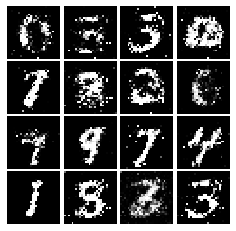

Epoch: 7, Iter: 3620, D: 0.2074, G:0.1525


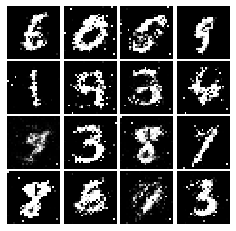

Epoch: 7, Iter: 3640, D: 0.2264, G:0.1731


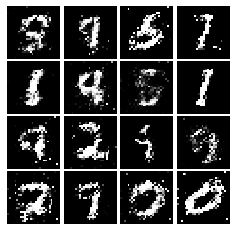

Epoch: 7, Iter: 3660, D: 0.2045, G:0.2016


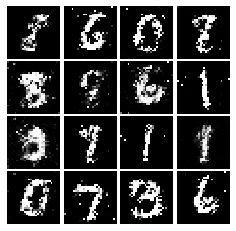

Epoch: 7, Iter: 3680, D: 0.2358, G:0.1657


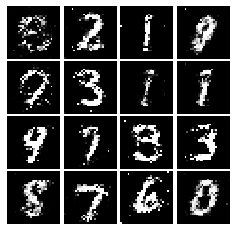

Epoch: 7, Iter: 3700, D: 0.2416, G:0.1618


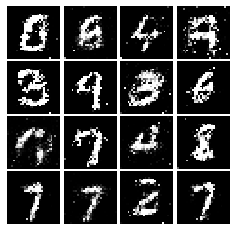

Epoch: 7, Iter: 3720, D: 0.2166, G:0.1758


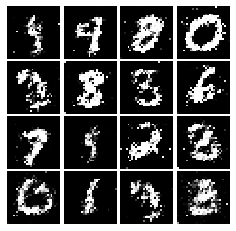

Epoch: 7, Iter: 3740, D: 0.2387, G:0.1768


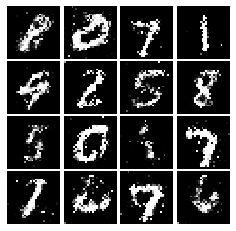

Epoch: 8, Iter: 3760, D: 0.2328, G:0.1697


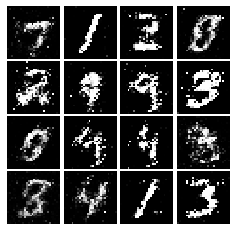

Epoch: 8, Iter: 3780, D: 0.2331, G:0.1731


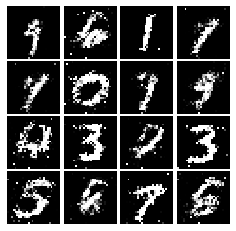

Epoch: 8, Iter: 3800, D: 0.214, G:0.1646


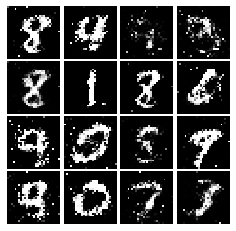

Epoch: 8, Iter: 3820, D: 0.2101, G:0.1654


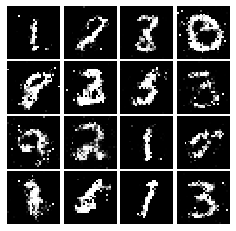

Epoch: 8, Iter: 3840, D: 0.222, G:0.1663


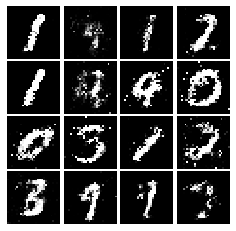

Epoch: 8, Iter: 3860, D: 0.2277, G:0.1583


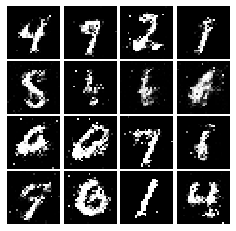

Epoch: 8, Iter: 3880, D: 0.2089, G:0.1803


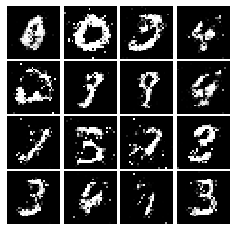

Epoch: 8, Iter: 3900, D: 0.2384, G:0.1456


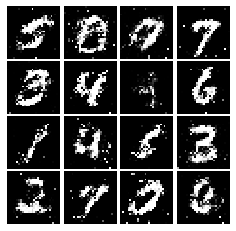

Epoch: 8, Iter: 3920, D: 0.224, G:0.1559


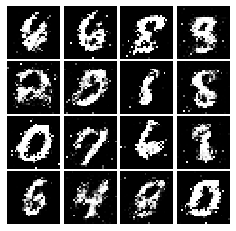

Epoch: 8, Iter: 3940, D: 0.2257, G:0.1688


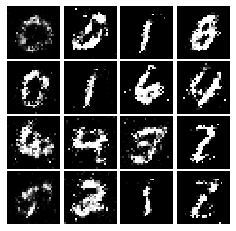

Epoch: 8, Iter: 3960, D: 0.2456, G:0.1779


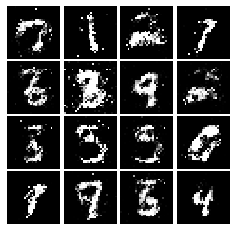

Epoch: 8, Iter: 3980, D: 0.2344, G:0.1633


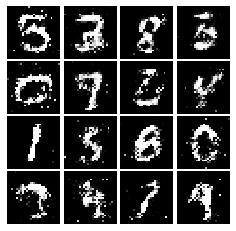

Epoch: 8, Iter: 4000, D: 0.2157, G:0.1674


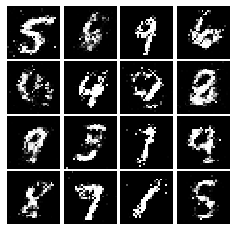

Epoch: 8, Iter: 4020, D: 0.2298, G:0.1592


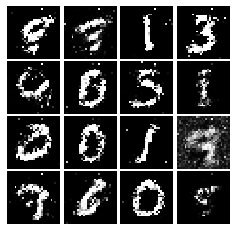

Epoch: 8, Iter: 4040, D: 0.2194, G:0.1674


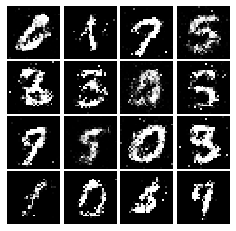

Epoch: 8, Iter: 4060, D: 0.1969, G:0.1528


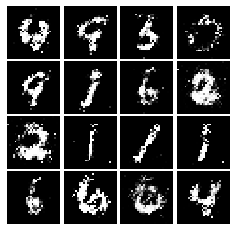

Epoch: 8, Iter: 4080, D: 0.2355, G:0.1662


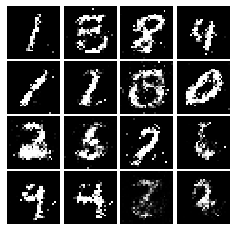

Epoch: 8, Iter: 4100, D: 0.2289, G:0.1613


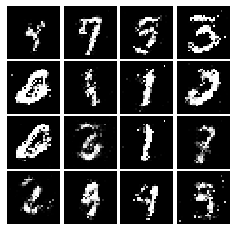

Epoch: 8, Iter: 4120, D: 0.238, G:0.152


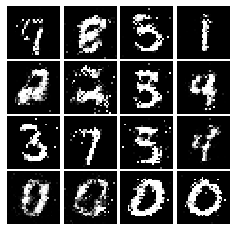

Epoch: 8, Iter: 4140, D: 0.2397, G:0.2005


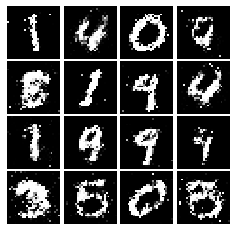

Epoch: 8, Iter: 4160, D: 0.2383, G:0.1602


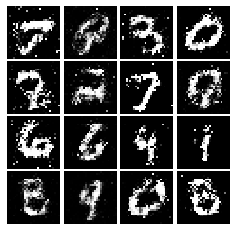

Epoch: 8, Iter: 4180, D: 0.2349, G:0.1655


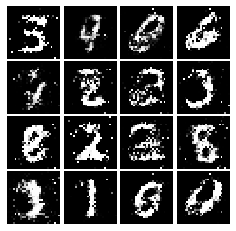

Epoch: 8, Iter: 4200, D: 0.2331, G:0.1653


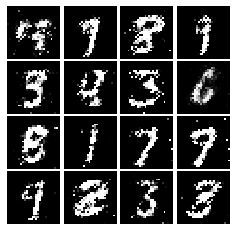

Epoch: 8, Iter: 4220, D: 0.2155, G:0.199


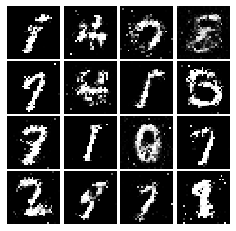

Epoch: 9, Iter: 4240, D: 0.2492, G:0.1533


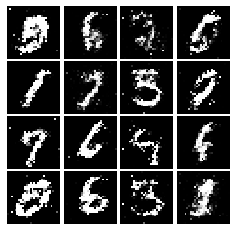

Epoch: 9, Iter: 4260, D: 0.2352, G:0.1467


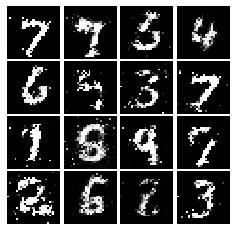

Epoch: 9, Iter: 4280, D: 0.2348, G:0.1795


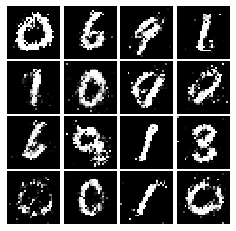

Epoch: 9, Iter: 4300, D: 0.2671, G:0.2053


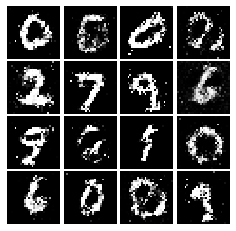

Epoch: 9, Iter: 4320, D: 0.2343, G:0.1598


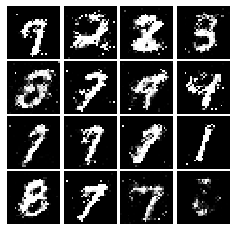

Epoch: 9, Iter: 4340, D: 0.2177, G:0.1461


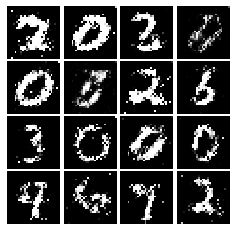

Epoch: 9, Iter: 4360, D: 0.2235, G:0.1708


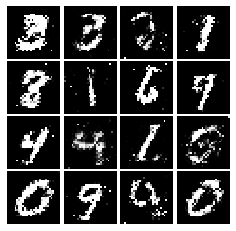

Epoch: 9, Iter: 4380, D: 0.2371, G:0.1395


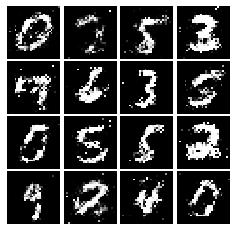

Epoch: 9, Iter: 4400, D: 0.2184, G:0.1724


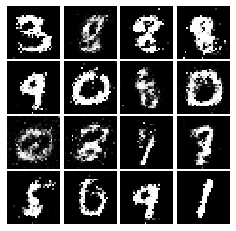

Epoch: 9, Iter: 4420, D: 0.2126, G:0.1661


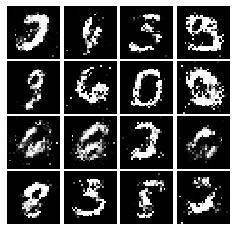

Epoch: 9, Iter: 4440, D: 0.2206, G:0.1703


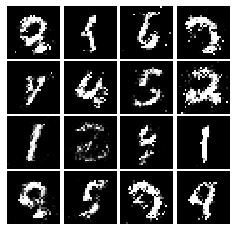

Epoch: 9, Iter: 4460, D: 0.2323, G:0.1552


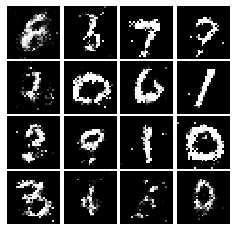

Epoch: 9, Iter: 4480, D: 0.2219, G:0.1764


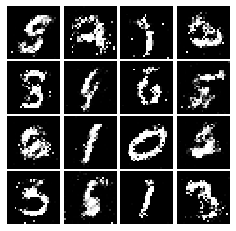

Epoch: 9, Iter: 4500, D: 0.2599, G:0.1543


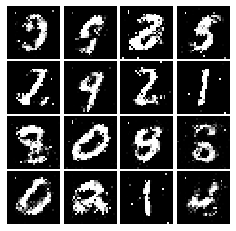

Epoch: 9, Iter: 4520, D: 0.2445, G:0.1544


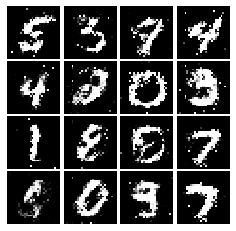

Epoch: 9, Iter: 4540, D: 0.2466, G:0.148


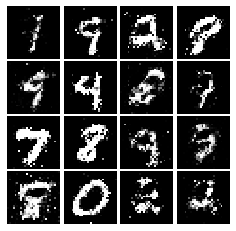

Epoch: 9, Iter: 4560, D: 0.2353, G:0.1532


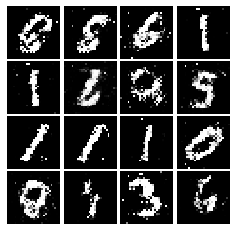

Epoch: 9, Iter: 4580, D: 0.2374, G:0.1685


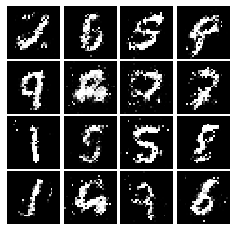

Epoch: 9, Iter: 4600, D: 0.2201, G:0.1699


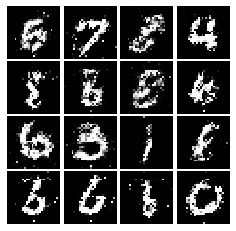

Epoch: 9, Iter: 4620, D: 0.2397, G:0.175


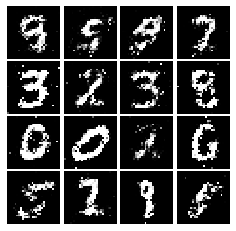

Epoch: 9, Iter: 4640, D: 0.2399, G:0.1677


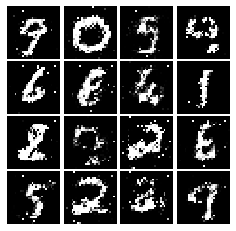

Epoch: 9, Iter: 4660, D: 0.2684, G:0.1614


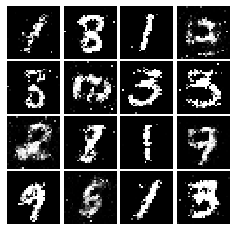

Epoch: 9, Iter: 4680, D: 0.2392, G:0.1938


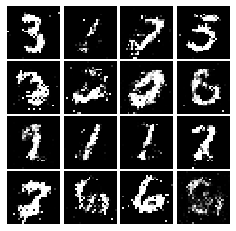

Final images


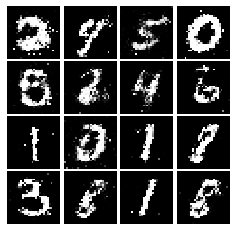

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [22]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape = (784, )),
        tf.keras.layers.Conv2D(filters = 32, kernel_size = (5, 5), strides = (1, 1), padding = 'valid'),
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
        tf.keras.layers.Conv2D(filters = 64, kernel_size = (5, 5), strides = (1, 1), padding = 'valid'),
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64),
        tf.keras.layers.LeakyReLU(alpha = 0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(tf.keras.layers.Dense(1024, use_bias = True, input_shape = (noise_dim, ), activation = 'relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(7 * 7 * 128, use_bias = True, activation = 'relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7, 7, 128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters = 64, kernel_size = (4, 4), strides=(2, 2), padding = 'same', activation = 'relu', use_bias = True))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters = 1, kernel_size = (4, 4), strides = (2, 2), padding = 'same', activation = 'tanh', use_bias = True))
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.347, G:0.6555


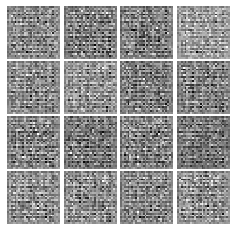

Epoch: 0, Iter: 20, D: 0.235, G:1.908


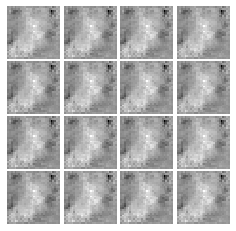

Epoch: 0, Iter: 40, D: 0.2255, G:2.817


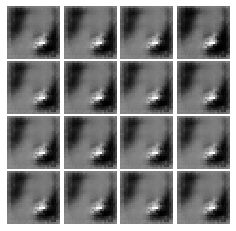

Epoch: 0, Iter: 60, D: 0.2268, G:3.758


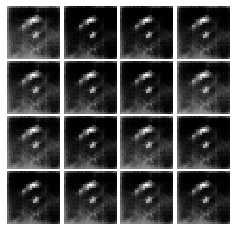

Epoch: 0, Iter: 80, D: 0.4565, G:1.652


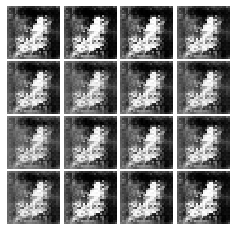

Epoch: 0, Iter: 100, D: 0.7038, G:4.704


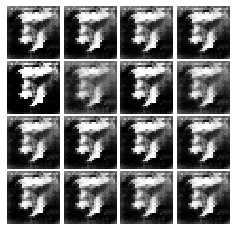

Epoch: 0, Iter: 120, D: 0.1592, G:3.974


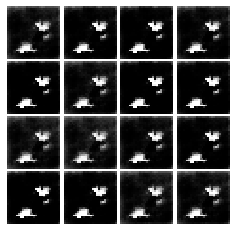

Epoch: 0, Iter: 140, D: 0.8621, G:1.627


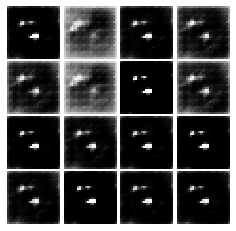

Epoch: 0, Iter: 160, D: 2.877, G:1.518


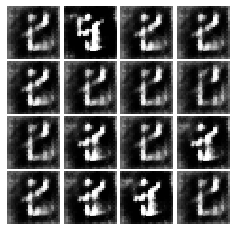

Epoch: 0, Iter: 180, D: 0.9326, G:5.924


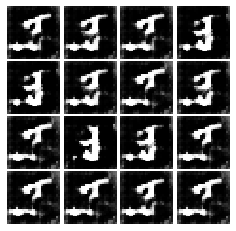

Epoch: 0, Iter: 200, D: 0.1835, G:3.496


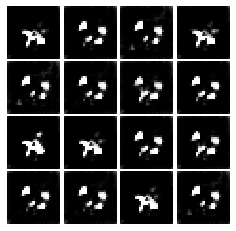

Epoch: 0, Iter: 220, D: 3.35, G:2.895


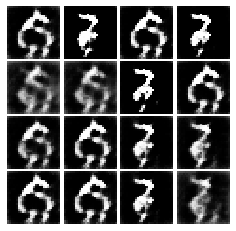

Epoch: 0, Iter: 240, D: 0.742, G:2.865


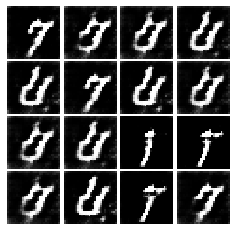

Epoch: 0, Iter: 260, D: 0.7349, G:3.027


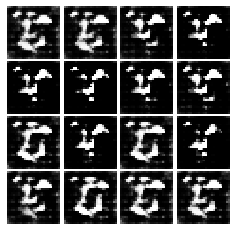

Epoch: 0, Iter: 280, D: 0.5517, G:2.397


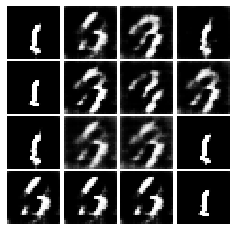

Epoch: 0, Iter: 300, D: 0.6299, G:2.382


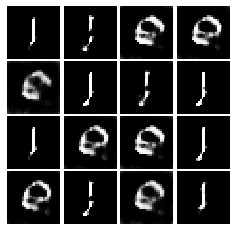

Epoch: 0, Iter: 320, D: 0.4954, G:2.751


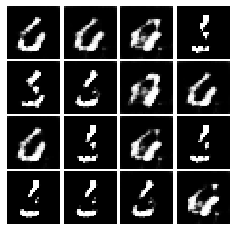

Epoch: 0, Iter: 340, D: 0.5698, G:2.491


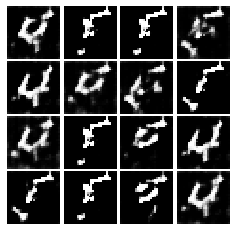

Epoch: 0, Iter: 360, D: 0.2266, G:2.133


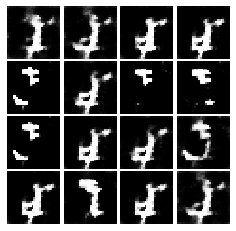

Epoch: 0, Iter: 380, D: 0.3778, G:3.494


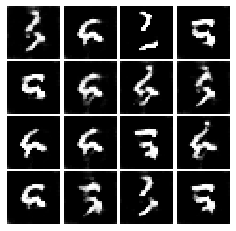

Epoch: 0, Iter: 400, D: 0.4074, G:3.627


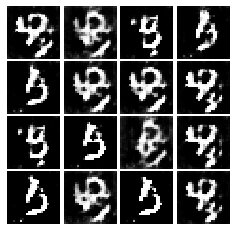

Epoch: 0, Iter: 420, D: 0.512, G:1.901


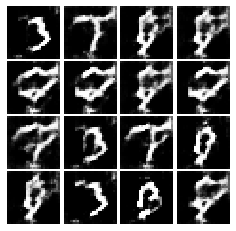

Epoch: 0, Iter: 440, D: 0.5595, G:2.561


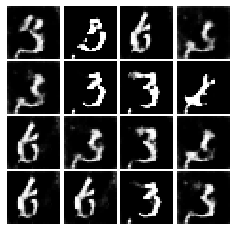

Epoch: 0, Iter: 460, D: 0.4526, G:3.752


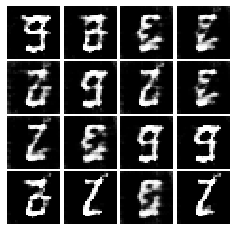

Epoch: 1, Iter: 480, D: 1.153, G:2.215


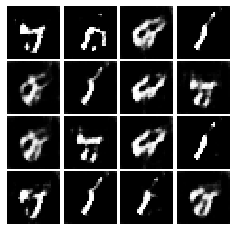

Epoch: 1, Iter: 500, D: 0.5092, G:2.111


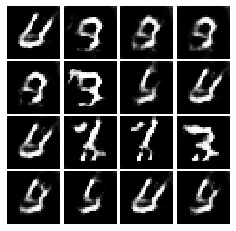

Epoch: 1, Iter: 520, D: 0.4235, G:2.231


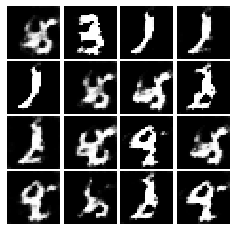

Epoch: 1, Iter: 540, D: 0.5251, G:2.386


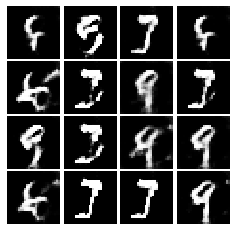

Epoch: 1, Iter: 560, D: 0.58, G:2.133


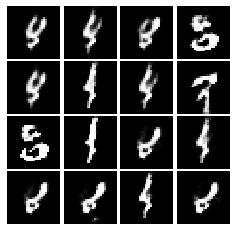

Epoch: 1, Iter: 580, D: 0.4505, G:2.666


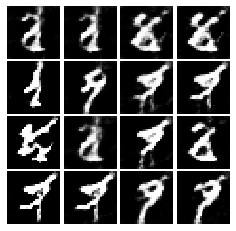

Epoch: 1, Iter: 600, D: 0.9474, G:1.782


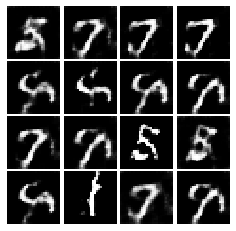

Epoch: 1, Iter: 620, D: 0.5055, G:2.383


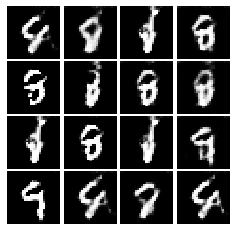

Epoch: 1, Iter: 640, D: 0.6482, G:2.381


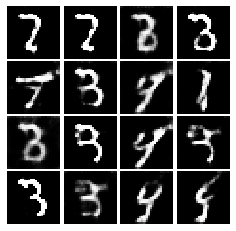

Epoch: 1, Iter: 660, D: 0.3939, G:3.119


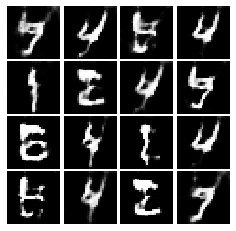

Epoch: 1, Iter: 680, D: 0.6948, G:1.364


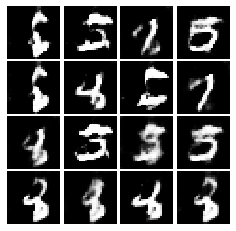

Epoch: 1, Iter: 700, D: 0.4032, G:3.14


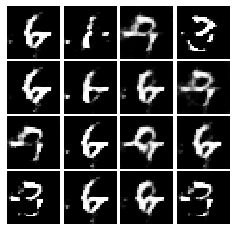

Epoch: 1, Iter: 720, D: 0.4311, G:3.799


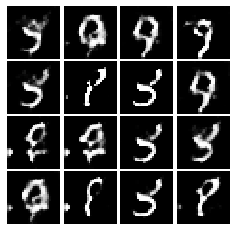

Epoch: 1, Iter: 740, D: 0.6673, G:2.51


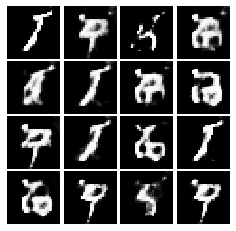

Epoch: 1, Iter: 760, D: 0.6634, G:1.657


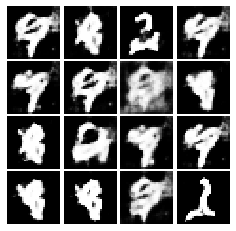

Epoch: 1, Iter: 780, D: 0.5195, G:3.503


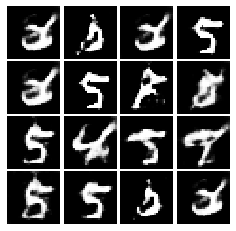

Epoch: 1, Iter: 800, D: 0.4529, G:2.112


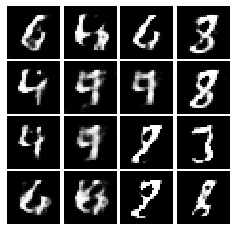

Epoch: 1, Iter: 820, D: 0.6697, G:2.883


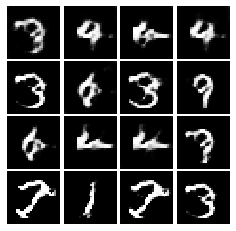

Epoch: 1, Iter: 840, D: 0.4718, G:2.615


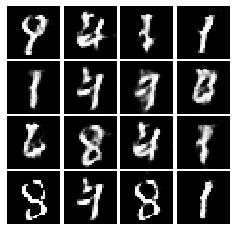

Epoch: 1, Iter: 860, D: 0.5215, G:2.225


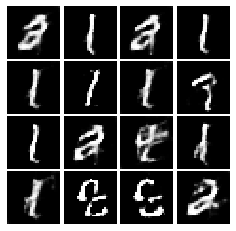

Epoch: 1, Iter: 880, D: 0.5531, G:2.184


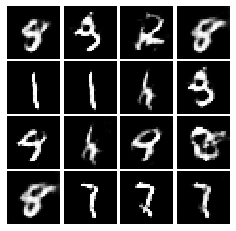

Epoch: 1, Iter: 900, D: 0.3698, G:2.437


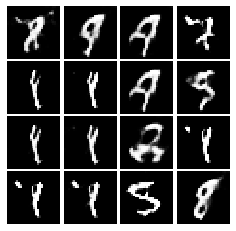

Epoch: 1, Iter: 920, D: 0.5615, G:3.542


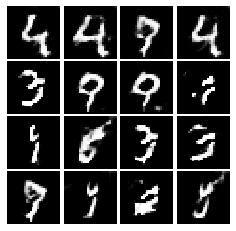

Epoch: 2, Iter: 940, D: 0.434, G:3.303


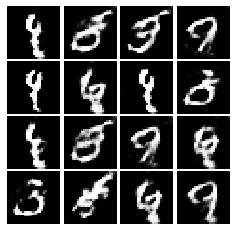

Epoch: 2, Iter: 960, D: 0.462, G:3.029


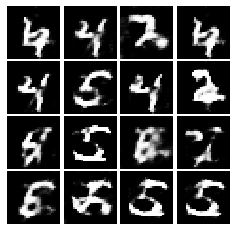

Epoch: 2, Iter: 980, D: 0.5648, G:2.509


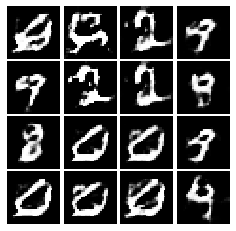

Epoch: 2, Iter: 1000, D: 0.6251, G:1.518


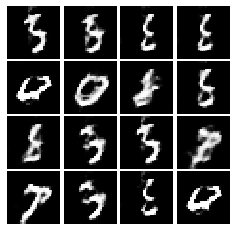

Epoch: 2, Iter: 1020, D: 0.6774, G:2.059


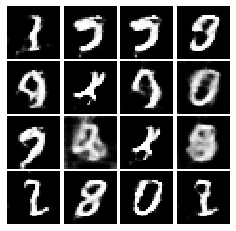

Epoch: 2, Iter: 1040, D: 0.8808, G:5.777


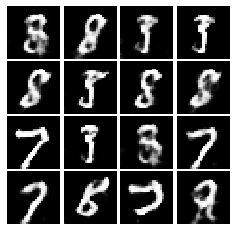

Epoch: 2, Iter: 1060, D: 0.4794, G:2.725


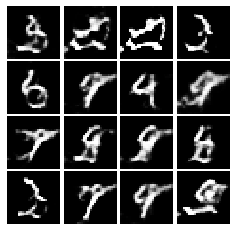

Epoch: 2, Iter: 1080, D: 0.5846, G:4.38


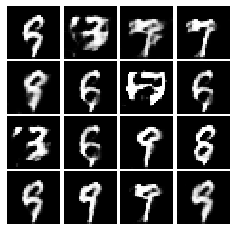

Epoch: 2, Iter: 1100, D: 0.45, G:2.665


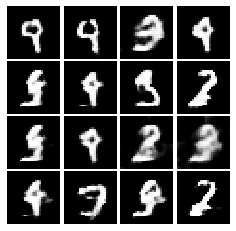

Epoch: 2, Iter: 1120, D: 0.6674, G:2.144


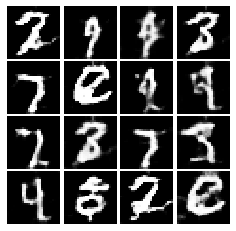

Epoch: 2, Iter: 1140, D: 0.4339, G:2.948


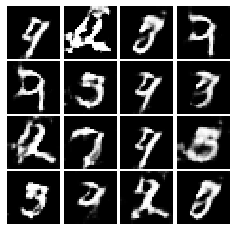

Epoch: 2, Iter: 1160, D: 0.3929, G:3.008


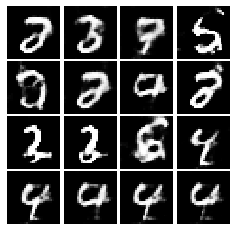

Epoch: 2, Iter: 1180, D: 0.4097, G:2.91


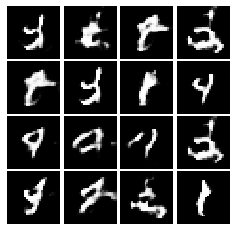

Epoch: 2, Iter: 1200, D: 0.3588, G:2.678


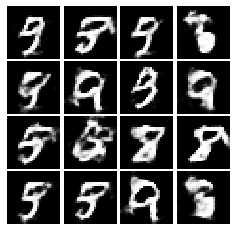

Epoch: 2, Iter: 1220, D: 0.5533, G:2.706


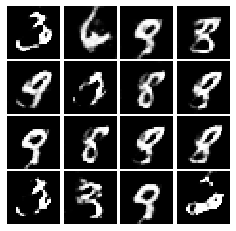

Epoch: 2, Iter: 1240, D: 0.4445, G:3.671


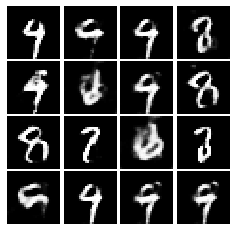

Epoch: 2, Iter: 1260, D: 0.5526, G:1.572


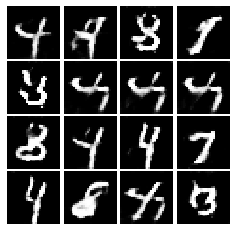

Epoch: 2, Iter: 1280, D: 0.3202, G:2.601


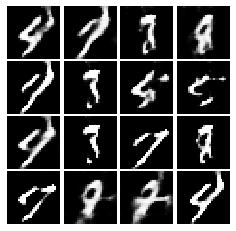

Epoch: 2, Iter: 1300, D: 0.4836, G:2.917


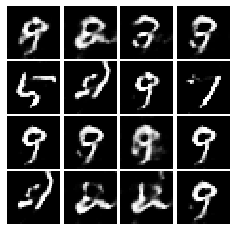

Epoch: 2, Iter: 1320, D: 0.2943, G:3.777


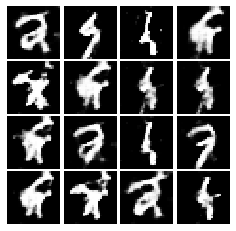

Epoch: 2, Iter: 1340, D: 0.3996, G:3.341


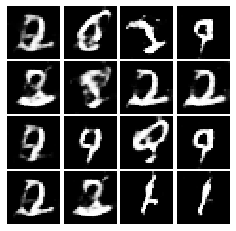

Epoch: 2, Iter: 1360, D: 0.4726, G:2.662


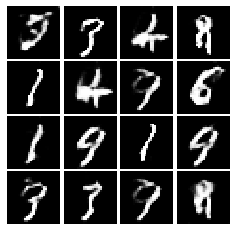

Epoch: 2, Iter: 1380, D: 0.2768, G:3.032


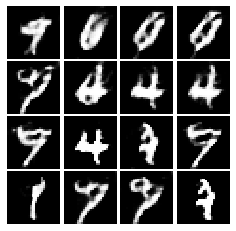

Epoch: 2, Iter: 1400, D: 0.5581, G:2.816


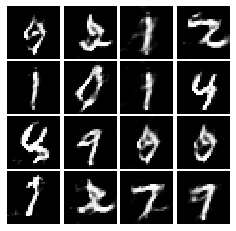

Epoch: 3, Iter: 1420, D: 0.3166, G:3.49


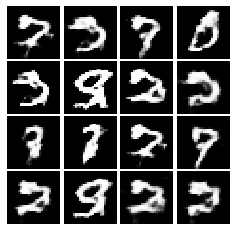

Epoch: 3, Iter: 1440, D: 0.442, G:3.359


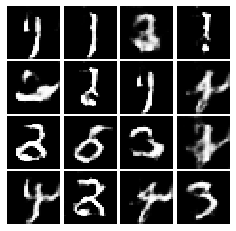

Epoch: 3, Iter: 1460, D: 0.4586, G:2.416


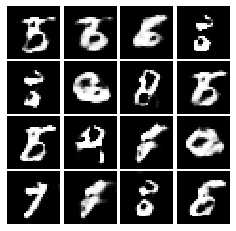

Epoch: 3, Iter: 1480, D: 0.6066, G:3.453


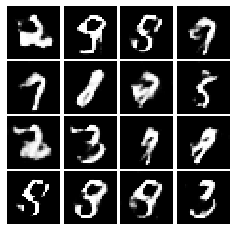

Epoch: 3, Iter: 1500, D: 0.4975, G:3.867


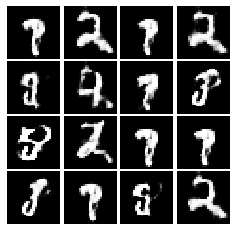

Epoch: 3, Iter: 1520, D: 0.4104, G:2.721


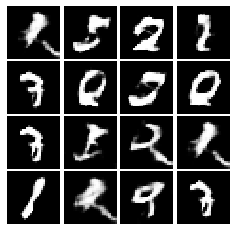

Epoch: 3, Iter: 1540, D: 0.6894, G:1.779


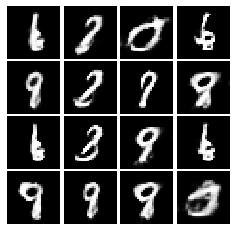

Epoch: 3, Iter: 1560, D: 0.7283, G:1.539


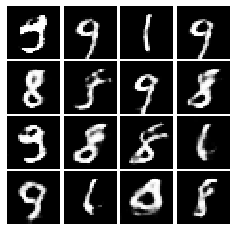

Epoch: 3, Iter: 1580, D: 0.6045, G:2.144


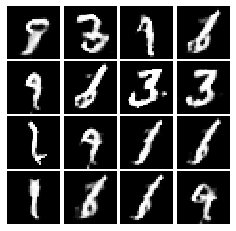

Epoch: 3, Iter: 1600, D: 0.4902, G:2.076


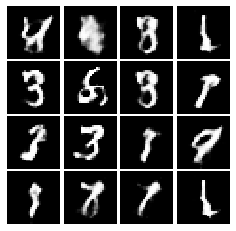

Epoch: 3, Iter: 1620, D: 0.3365, G:2.594


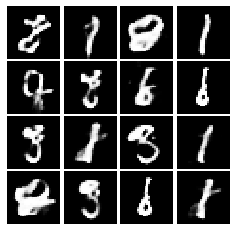

Epoch: 3, Iter: 1640, D: 0.5696, G:2.623


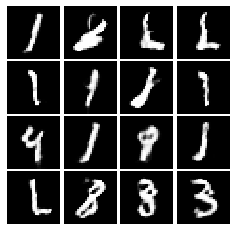

Epoch: 3, Iter: 1660, D: 0.5779, G:2.511


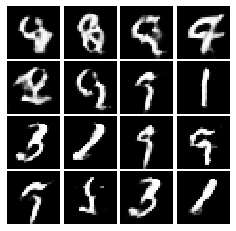

Epoch: 3, Iter: 1680, D: 0.5931, G:2.198


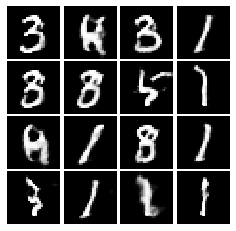

Epoch: 3, Iter: 1700, D: 0.5706, G:2.061


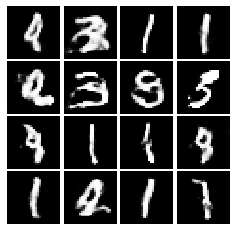

Epoch: 3, Iter: 1720, D: 0.5332, G:2.04


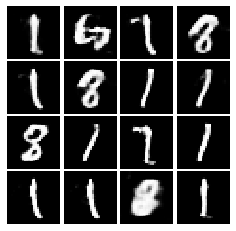

Epoch: 3, Iter: 1740, D: 0.6659, G:1.962


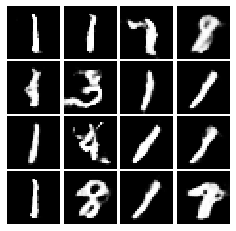

Epoch: 3, Iter: 1760, D: 0.5741, G:2.475


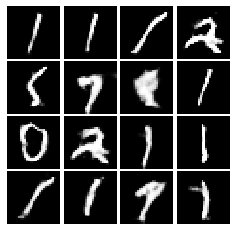

Epoch: 3, Iter: 1780, D: 0.4697, G:2.223


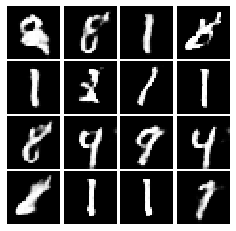

Epoch: 3, Iter: 1800, D: 0.8754, G:1.596


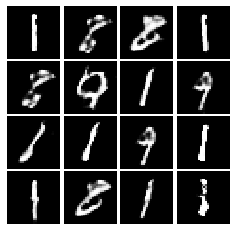

Epoch: 3, Iter: 1820, D: 0.7262, G:1.575


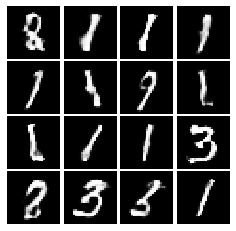

Epoch: 3, Iter: 1840, D: 0.6914, G:2.79


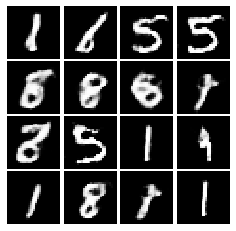

Epoch: 3, Iter: 1860, D: 0.5619, G:1.862


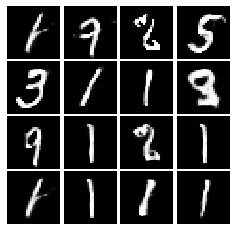

Epoch: 4, Iter: 1880, D: 0.4038, G:2.191


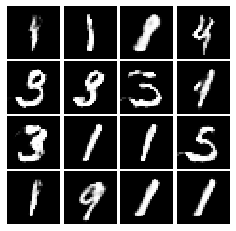

Epoch: 4, Iter: 1900, D: 0.5484, G:2.065


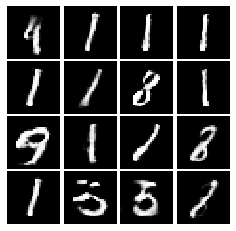

Epoch: 4, Iter: 1920, D: 0.5204, G:2.524


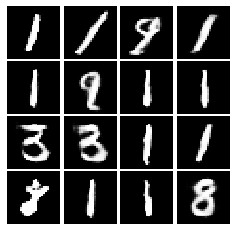

Epoch: 4, Iter: 1940, D: 0.4367, G:2.185


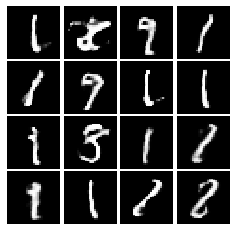

Epoch: 4, Iter: 1960, D: 0.4194, G:2.858


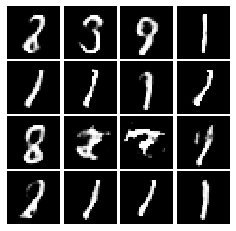

Epoch: 4, Iter: 1980, D: 0.4244, G:2.531


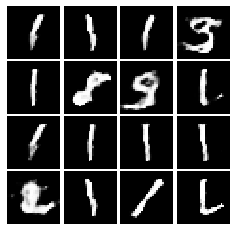

Epoch: 4, Iter: 2000, D: 0.8999, G:2.103


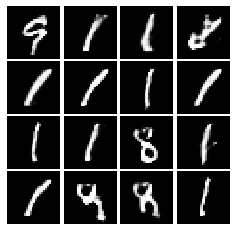

Epoch: 4, Iter: 2020, D: 0.4365, G:2.365


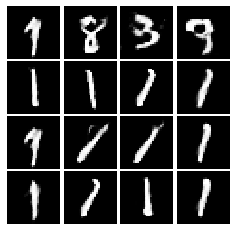

Epoch: 4, Iter: 2040, D: 0.6328, G:1.91


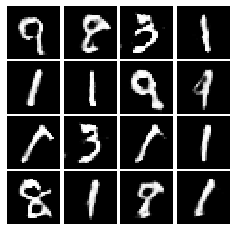

Epoch: 4, Iter: 2060, D: 0.4114, G:2.754


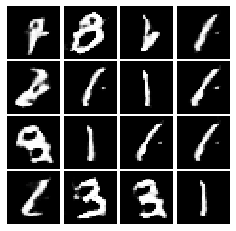

Epoch: 4, Iter: 2080, D: 0.5097, G:2.123


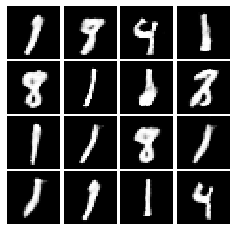

Epoch: 4, Iter: 2100, D: 0.4395, G:2.678


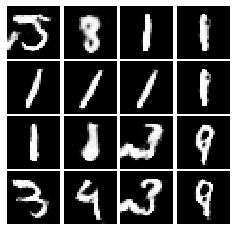

Epoch: 4, Iter: 2120, D: 0.5157, G:2.082


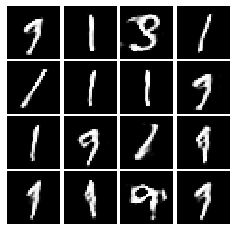

Epoch: 4, Iter: 2140, D: 0.6835, G:2.308


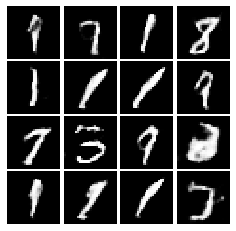

Epoch: 4, Iter: 2160, D: 0.5465, G:2.305


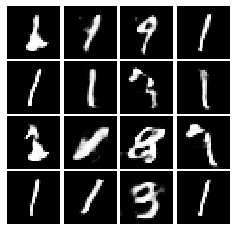

Epoch: 4, Iter: 2180, D: 0.452, G:2.933


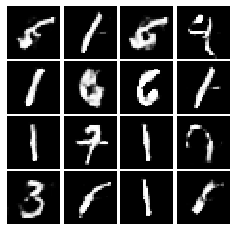

Epoch: 4, Iter: 2200, D: 0.6127, G:1.978


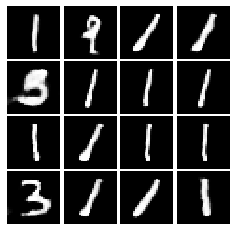

Epoch: 4, Iter: 2220, D: 0.5824, G:2.021


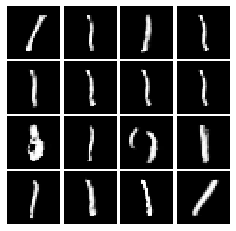

Epoch: 4, Iter: 2240, D: 0.5938, G:2.84


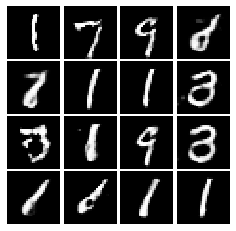

Epoch: 4, Iter: 2260, D: 0.4161, G:2.471


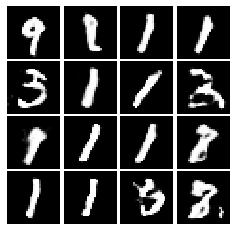

Epoch: 4, Iter: 2280, D: 0.6353, G:2.338


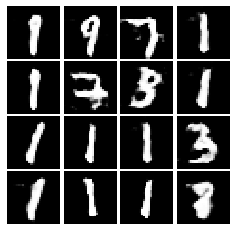

Epoch: 4, Iter: 2300, D: 0.5655, G:2.268


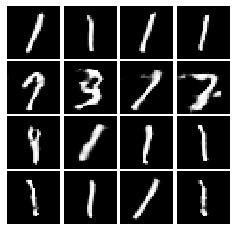

Epoch: 4, Iter: 2320, D: 0.4206, G:2.585


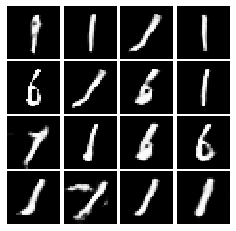

Epoch: 4, Iter: 2340, D: 0.4815, G:2.445


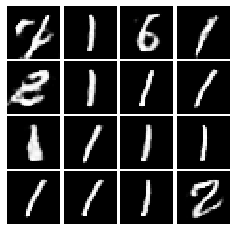

Final images


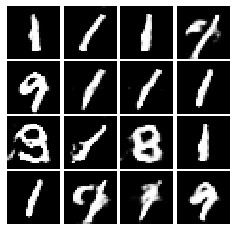

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)